In [1]:
## by Joh Schöneberg, 2017-2018, all rights reserved
# slight modifications and addition of code by Charlotte Kaplan, 2019
# slight modifications and addition of code by Jennifer Hill, 2023

%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import os
import scipy.ndimage
import imageio.v2 as imageio
import pandas as pd
import math as m


###################### - Variables subject to change for each analysis run ###################
# size of the median filter
# options: can be set from 1 to a large number, e.g. 100
medianFilterSize = 50

# threshold value to read off the width
# options: can be set to an arbitrary value between 0 and 1, best between 0.1 and 0.9
thresholdForWidth = 0.5

# scaling factor from pixels to nm (unit: nm/pixel)
scale_bar_nm_length = 100
scale_bar_pixel_length = 73
factor_nm = scale_bar_pixel_length/scale_bar_nm_length

# pathnames to input/output files
experimentID = 10
path_to_files = "raw_data/08072023/Cell_2/"

csv_filename = "STORM_256x256_0010_AVG_analysis_match.csv" #contains all matched and scored structures in XY and XZ
intensity_csv_filename = "intensity_list.csv" #contains intensities for all matched structures
XY_filename_prefix = "STORM_256x256_0010_TopView_scale/STORM_256x256_0010_TopView_" #folder containing pngs of all matched structures in XY
XZ_filename_prefix = "STORM_256x256_0010_SideView_scale/STORM_256x256_0010_SideView_" #folder containing pngs of all matched structures in XZ

output_filename = 'STORM_256x256_0010_analysis_results'

# choose which filters to use
filter_sac6 = True #filters out all patches with no Sac6 signal
filter_rvs167 = True #filters out all patches with no Rvs167 signal
filter_XZ = True #filters out all patches with incorrect XZ structure
filter_XY = True #filters out all patches with incorrect XY structure

# choose how to display XY images with max/upper/lower indexes in notebook
# options: True, False
show_images = True
dark_plot_style = False

In [2]:
## Create output folder

# set date for folder names
import datetime

now = datetime.datetime.now()
date = now.strftime('%Y%m%d')

output_folder = path_to_files + 'parameter_analysis_results_' + date + '/'

# make analysis folder in path_to_files
import os

def createFolder(directory):
    try:
        if not os.path.exists(directory):
            os.makedirs(directory)
    except OSError:
        print ('Error: Creating directory. ' +  directory)

createFolder(output_folder)

print('Created output folder: ' + output_folder)

Created output folder: raw_data/08072023/Cell_2/parameter_analysis_results_20240319/


In [3]:
## Load in data

# load in scored structures
data = pd.read_csv(path_to_files+csv_filename)#,header=0,skiprows=1)
data= data.iloc[:,0:5] #select the first 5 columns
data.columns = ['ImageID','Actin structure XY','Actin structure XZ','Sac6','Rvs167']

# load in intensities and attach to dataframe
intensities = pd.read_csv(path_to_files+intensity_csv_filename)
intensities.columns = ['Sac6 Intensity']
data = pd.concat([data, intensities], axis=1)

# select only the good structures (actin XY and YZ look good and Sac6 signal is present)
if filter_XY == True:
    excel_clean = data[(data['Actin structure XY'] == 1)]  
if filter_XZ == True:
    excel_clean = excel_clean[(excel_clean['Actin structure XZ'] == 1)]
if filter_sac6 == True:
    excel_clean = excel_clean[(excel_clean['Sac6'] == 1)]
if filter_rvs167 == True:                       
    excel_clean = excel_clean[(excel_clean['Rvs167']==1)]

excel_clean

,ImageID,Actin structure XY,Actin structure XZ,Sac6,Rvs167,Sac6 Intensity
6,7,1,1,1,1,16.5760
7,8,1,1,1,1,8.8221
10,11,1,1,1,1,72.3530
11,12,1,1,1,1,61.7140
12,13,1,1,1,1,38.8550
13,14,1,1,1,1,16.7640
17,18,1,1,1,1,11.8370
20,21,1,1,1,1,153.3500
26,27,1,1,1,1,86.0340
27,28,1,1,1,1,78.4810


In [4]:
## Define functions

# define f(x) make_colormap
def make_colormap(seq):
    """Return a LinearSegmentedColormap
    seq: a sequence of floats and RGB-tuples. The floats should be increasing
    and in the interval (0,1).
    """
    seq = [(None,) * 3, 0.0] + list(seq) + [1.0, (None,) * 3]
    cdict = {'red': [], 'green': [], 'blue': []}
    for i, item in enumerate(seq):
        if isinstance(item, float):
            r1, g1, b1 = seq[i - 1]
            r2, g2, b2 = seq[i + 1]
            cdict['red'].append([item, r1, r2])
            cdict['green'].append([item, g1, g2])
            cdict['blue'].append([item, b1, b2])
    return mcolors.LinearSegmentedColormap('CustomMap', cdict)

# make a magenta colormap to color actin structures
c = mcolors.ColorConverter().to_rgb
black2magenta = make_colormap(
    [c('black'), c('magenta')])

# define f(x) ma that returns a mean filtered array
def ma(a, n=100) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:]/n

# define f(x) rgb2gray that converts an rgb image into grayscale
# https://stackoverflow.com/questions/12201577/how-can-i-convert-an-rgb-image-into-grayscale-in-python
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

def removeScalebarXY(img):
    imgUpd = img
    for x in range(297,330):
        for y in range(36,44):
            imgUpd[y,x]=0
    return imgUpd

def removeScalebarXZ(img):
    imgUpd = img
    for x in range(322,330):
        for y in range(36,69):
            imgUpd[y,x]=0
    return imgUpd

def importImage(XY_filename, XZ_filename):
    XY_rgb = imageio.imread(path_to_files+XY_filename)
    XZ_rgb = imageio.imread(path_to_files+XZ_filename)
    XY_grey = rgb2gray(XY_rgb)    
    XZ_grey = rgb2gray(XZ_rgb)  
    #XY_grey = removeScalebarXY(XY_grey)
    #XZ_grey = removeScalebarXZ(XZ_grey)
    return [XY_grey,XZ_grey]

def get_max_indexes_and_histos(median_img_XY, median_img_XZ, thresholdForWidth=0.3):
    XY_max_index_X = np.where(median_img_XY == median_img_XY.max())[1][0]
    XY_max_index_Y = np.where(median_img_XY == median_img_XY.max())[0][0]
    XZ_max_index_X = np.where(median_img_XZ == median_img_XZ.max())[1][0]
    XZ_max_index_Z = np.where(median_img_XZ == median_img_XZ.max())[0][0]
    
    #extract histogram of values along X at max_index_Y, values along Y at max_index_X, etc
    histo_X = median_img_XY[XY_max_index_Y, :]
    histo_Y = median_img_XY[:, XY_max_index_X]
    histo_Z = median_img_XZ[:, XZ_max_index_X]
    
    [lower_index_X, upper_index_X] = get_upper_and_lower_indexes(XY_max_index_X, histo_X, thresholdForWidth)
    [lower_index_Y, upper_index_Y] = get_upper_and_lower_indexes(XY_max_index_Y, histo_Y, thresholdForWidth)
    [lower_index_Z, upper_index_Z] = get_upper_and_lower_indexes(XZ_max_index_Z, histo_Z, thresholdForWidth)
        
    
    return [np.array([lower_index_X, XY_max_index_X, upper_index_X,
                      lower_index_Y, XY_max_index_Y, upper_index_Y,
                      lower_index_Z, XZ_max_index_Z, upper_index_Z]), 
            histo_X, histo_Y, histo_Z]

def get_upper_and_lower_indexes(max_index, histo, thresholdForWidth=0.3):
    #calculate upper and lower index for thresholdForWidth
    lower_index = np.where(np.round(histo[0:max_index]/histo.max(),1) == thresholdForWidth)
    if len(lower_index[0])>0:
        lower_index = lower_index[0][-1]
    else:
        lower_index = 0
        
    upper_index = np.where(np.round(histo[max_index:-1]/histo.max(),1) == thresholdForWidth)
    if len(upper_index[0])>0:
        upper_index = max_index + upper_index[0][0]
    else:
        upper_index = -1
    
    return[lower_index, upper_index]

def get_intensity_density(histo,lower_index, upper_index):
    total_int = 0
    for px in range(lower_index, upper_index + 1):
        total_int = total_int + histo[px]
        
    int_density = total_int/(upper_index - lower_index + 1)
    
    return[total_int, int_density]

IMAGE ID 7


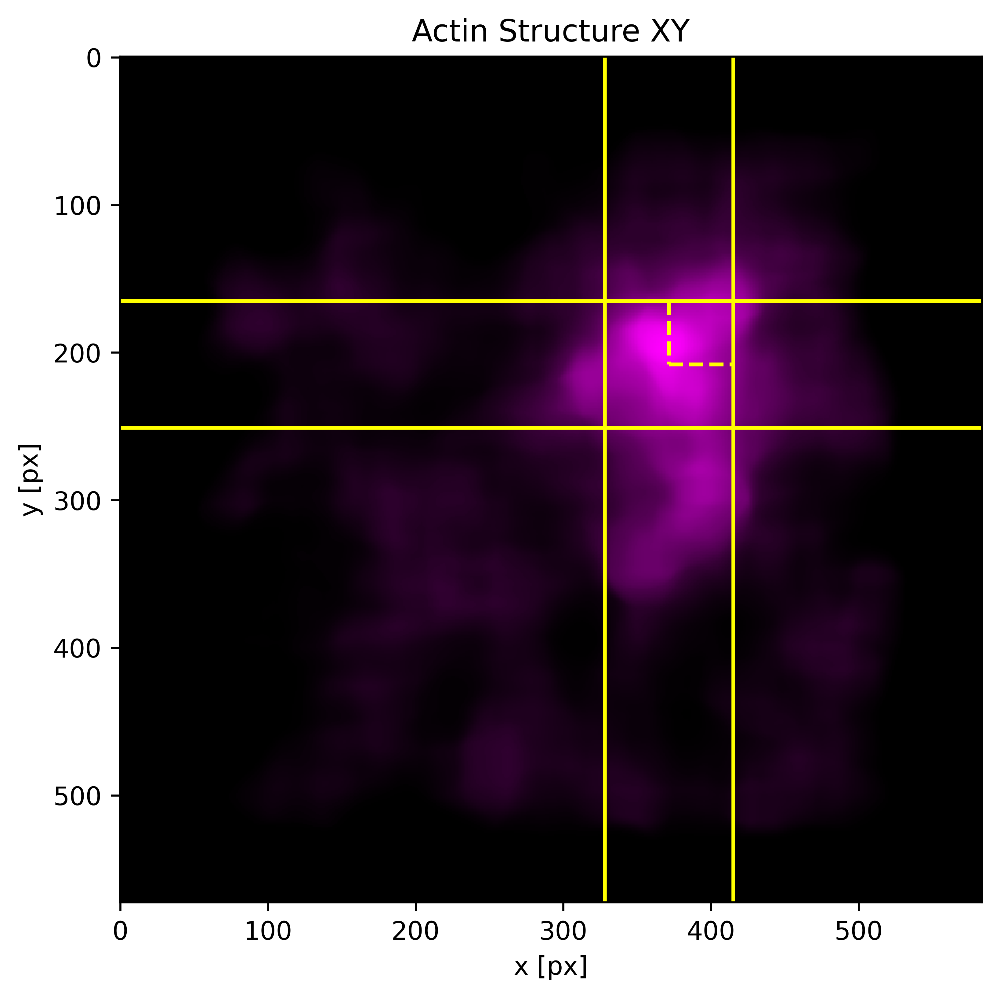

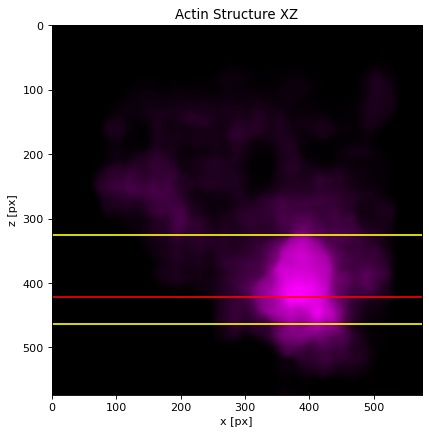

IMAGE ID 8


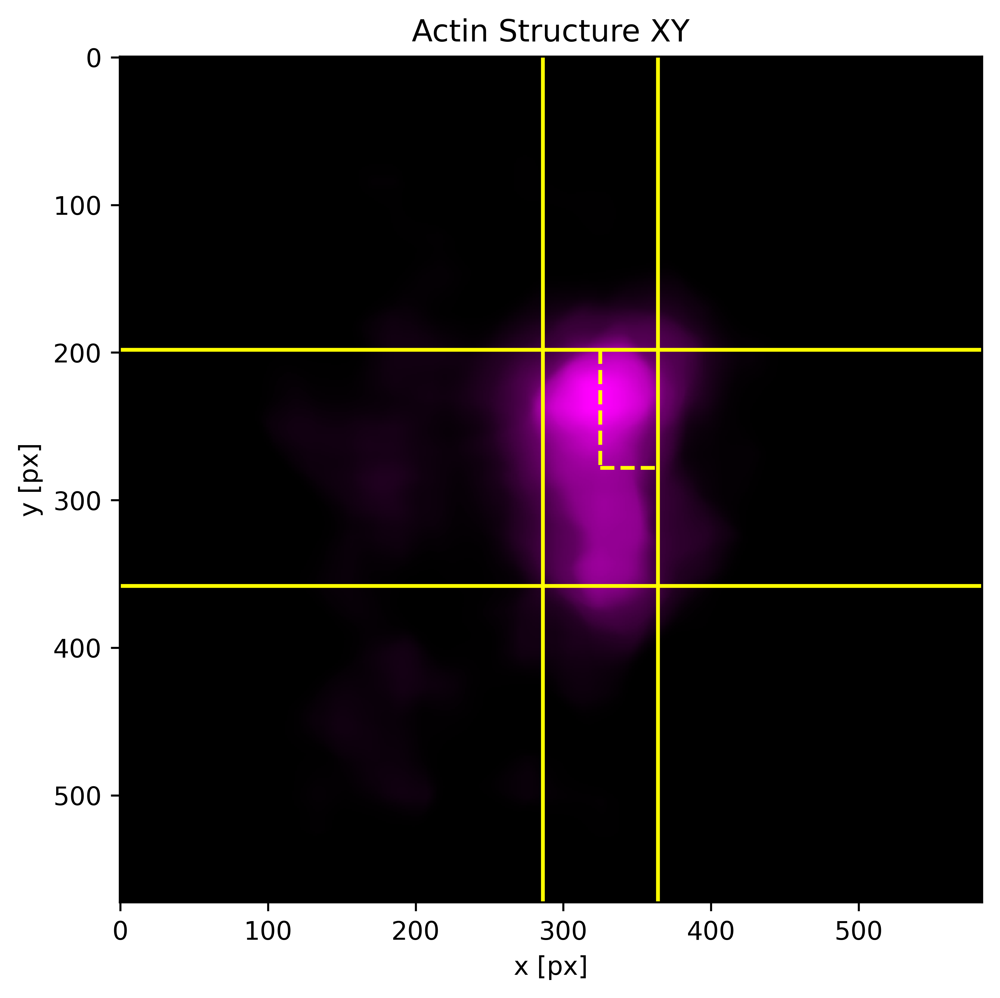

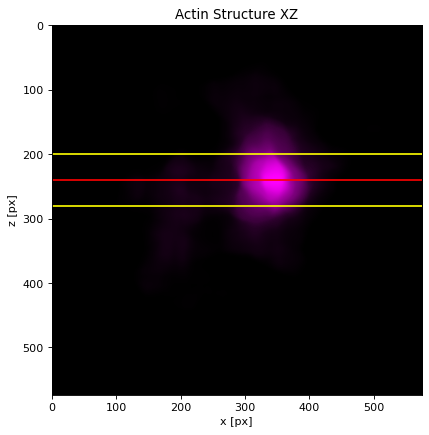

IMAGE ID 11


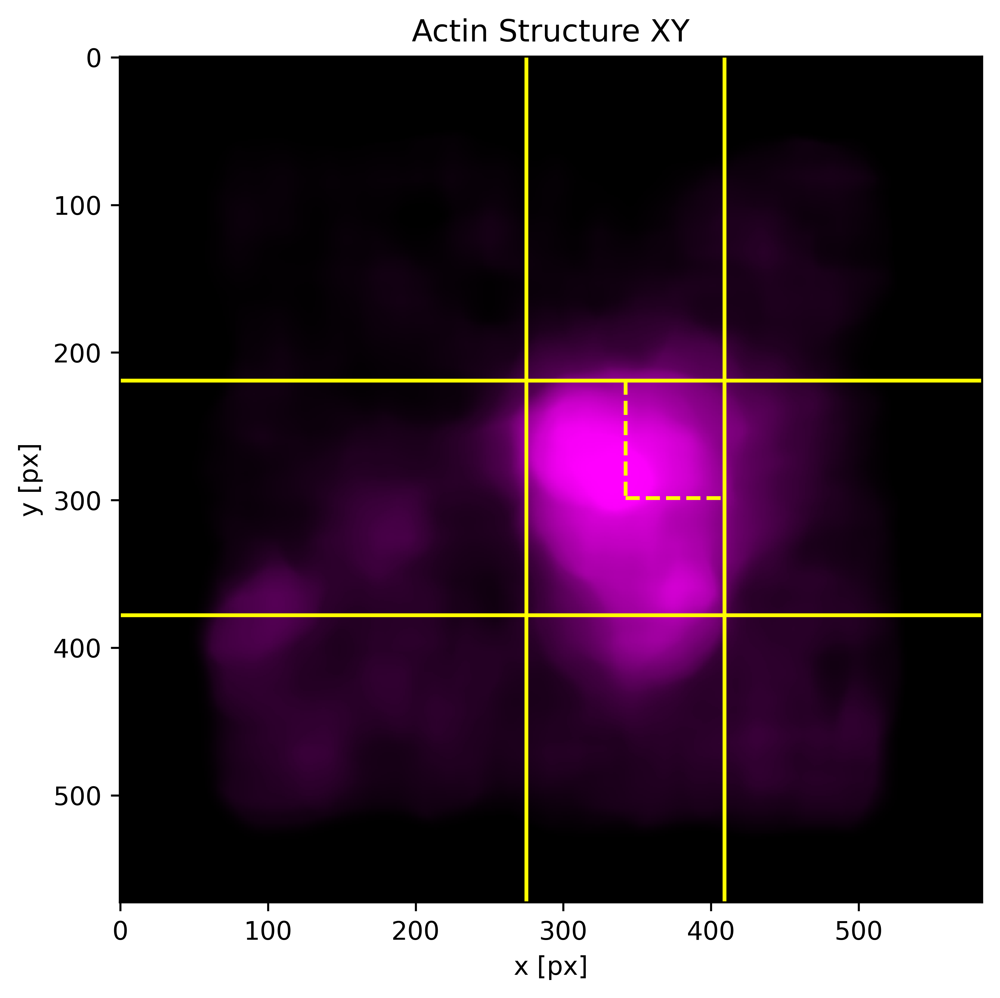

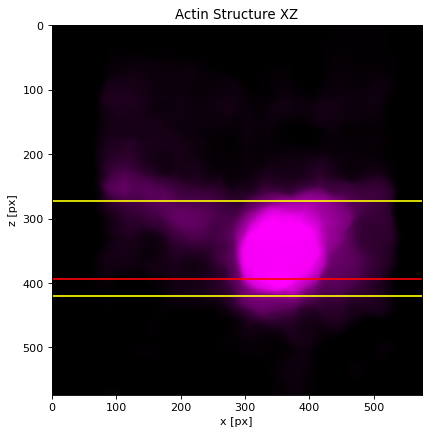

IMAGE ID 12


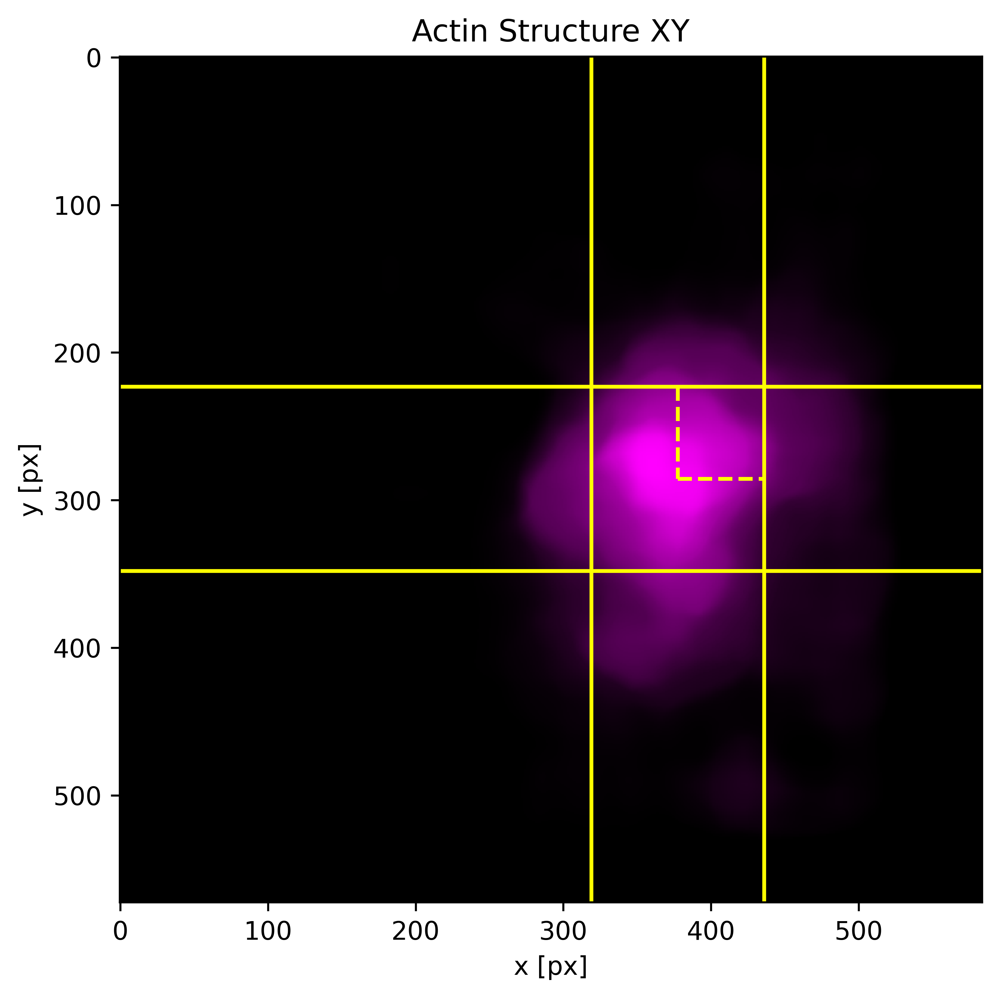

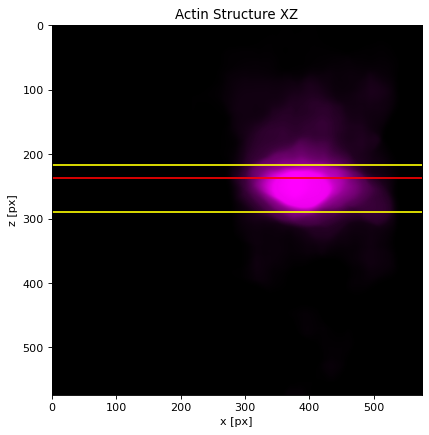

IMAGE ID 13


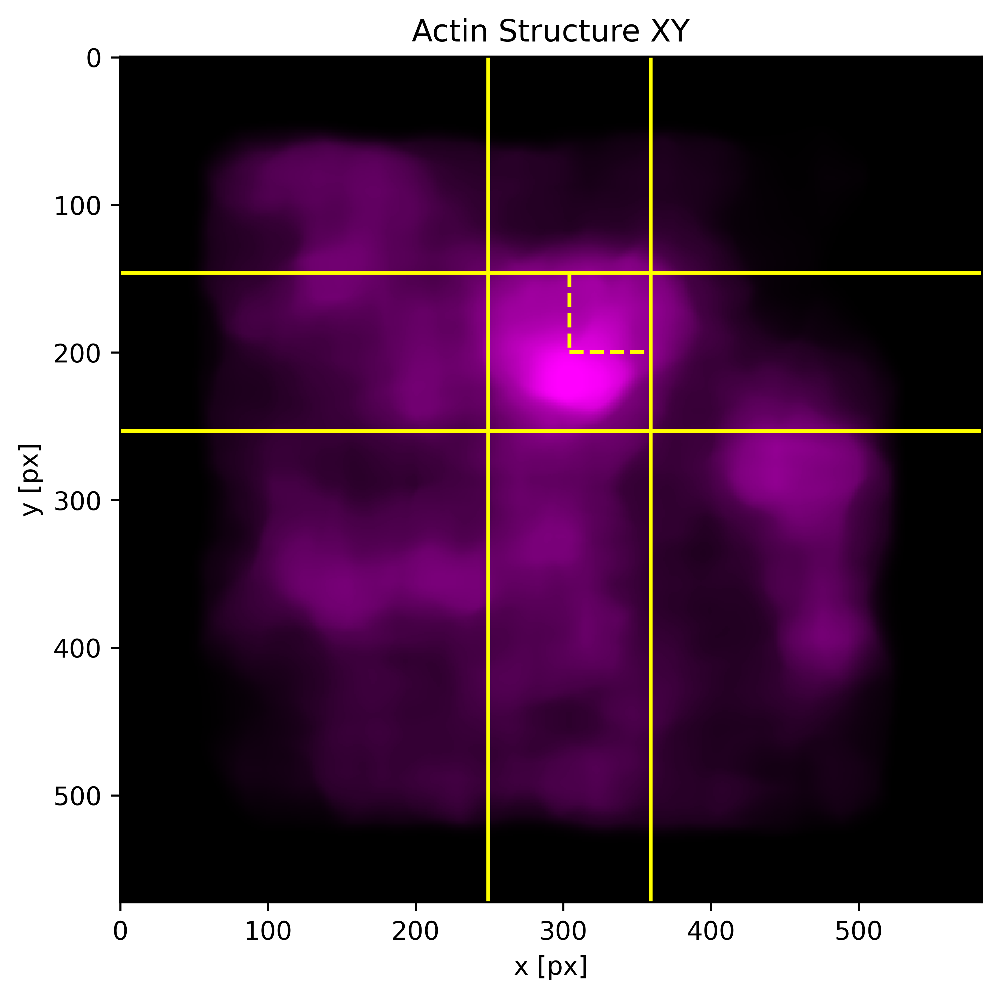

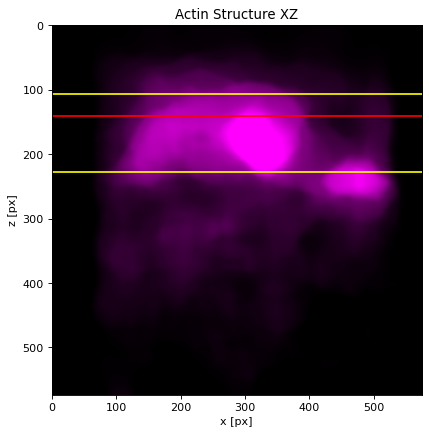

IMAGE ID 14


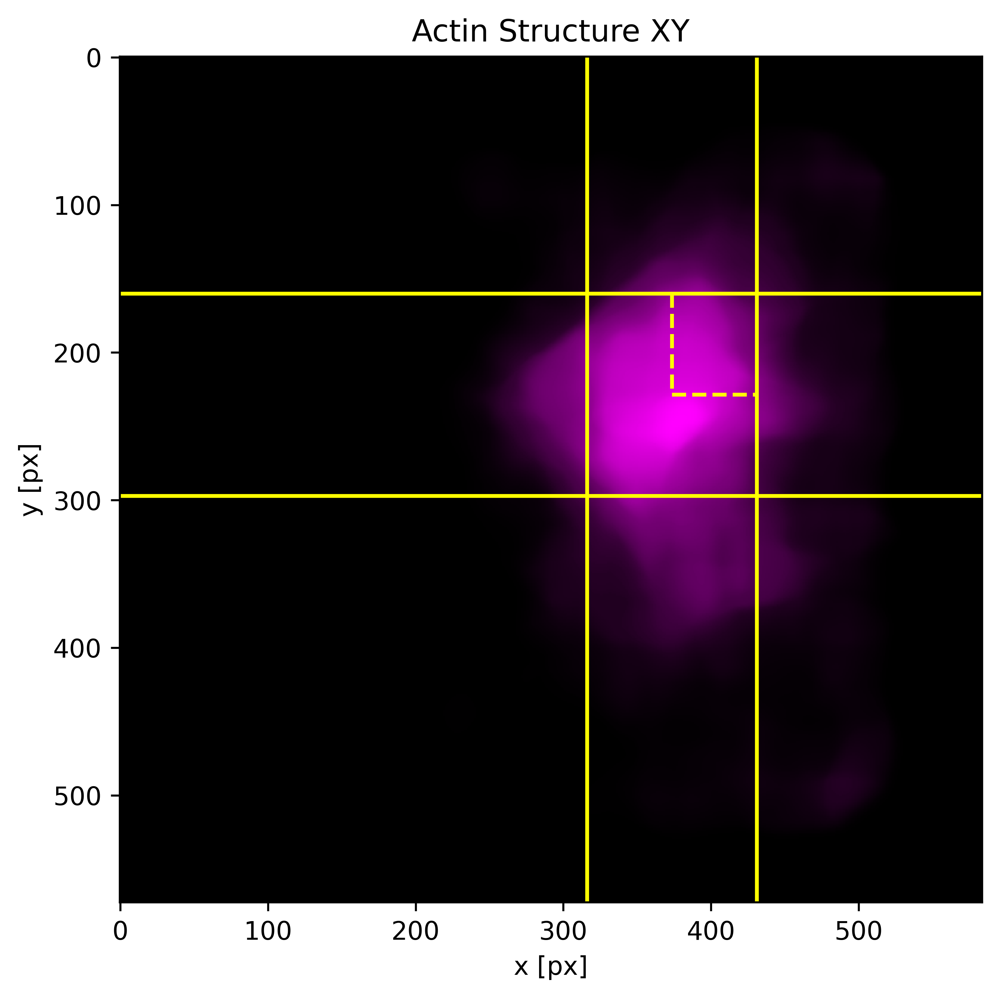

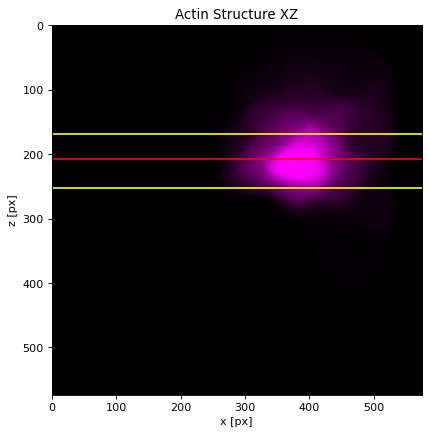

IMAGE ID 18


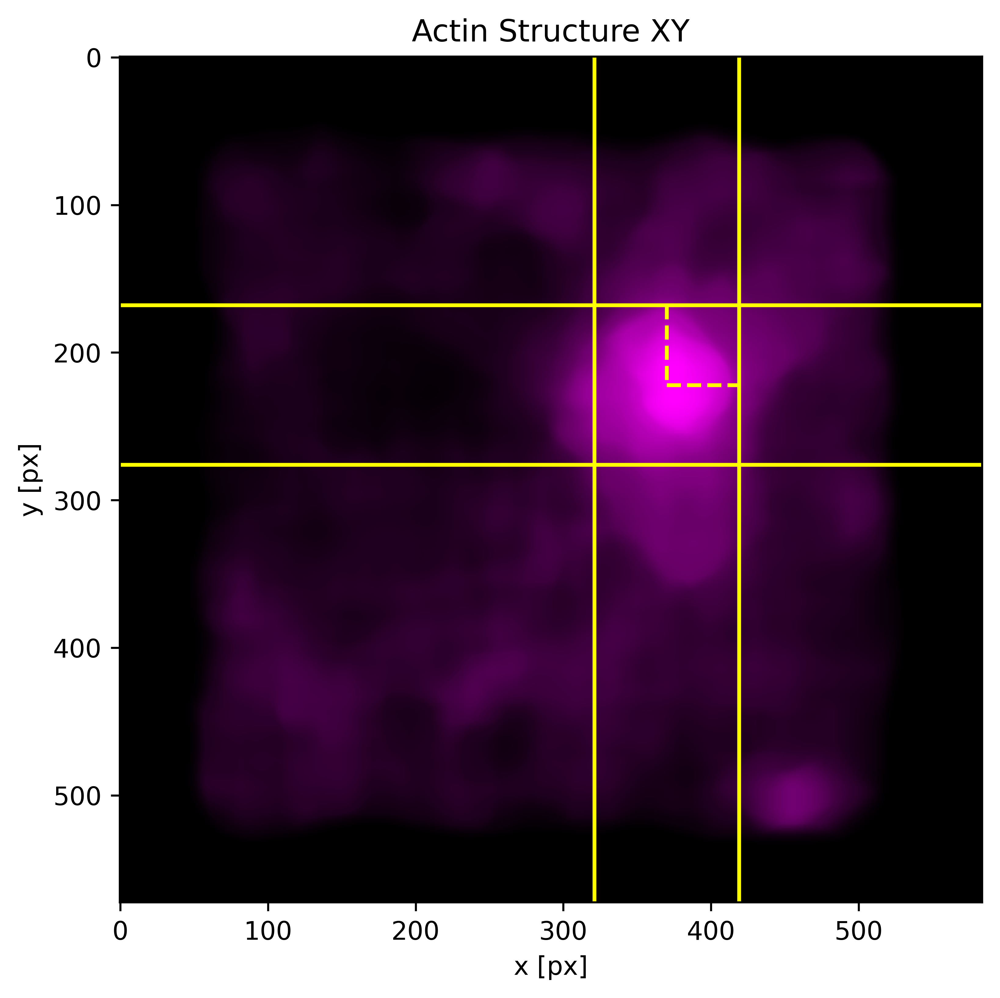

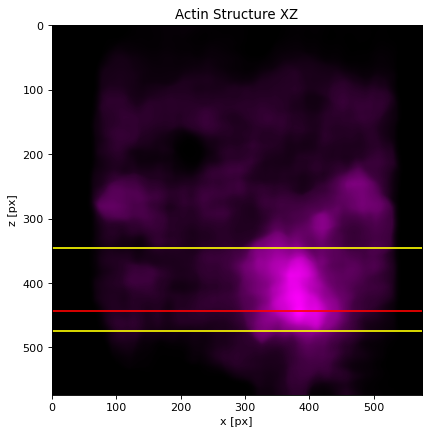

IMAGE ID 21


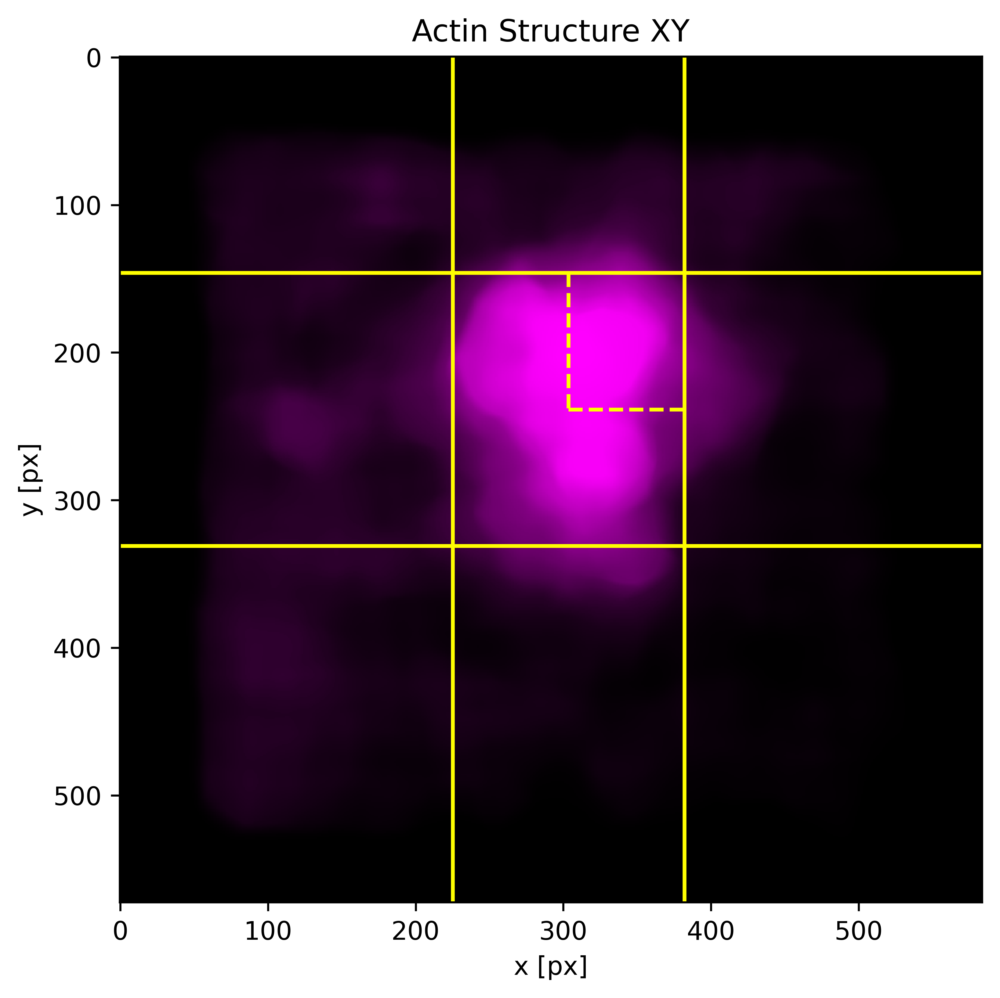

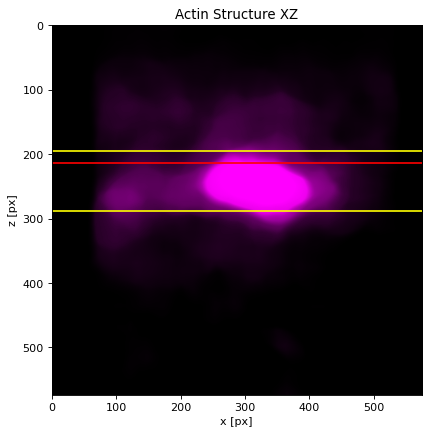

IMAGE ID 27


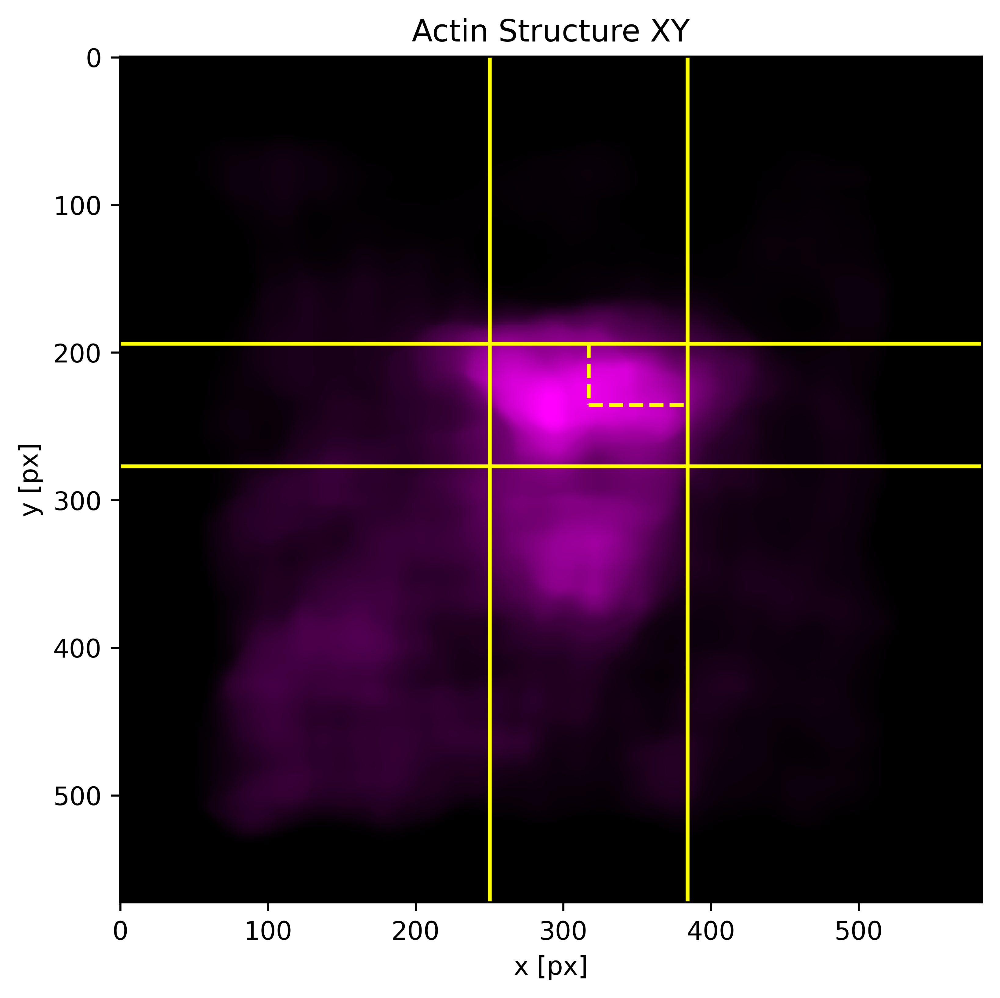

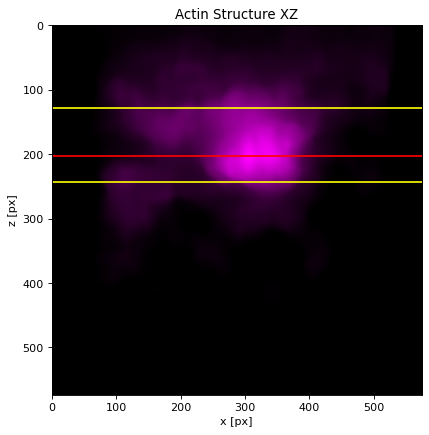

IMAGE ID 28


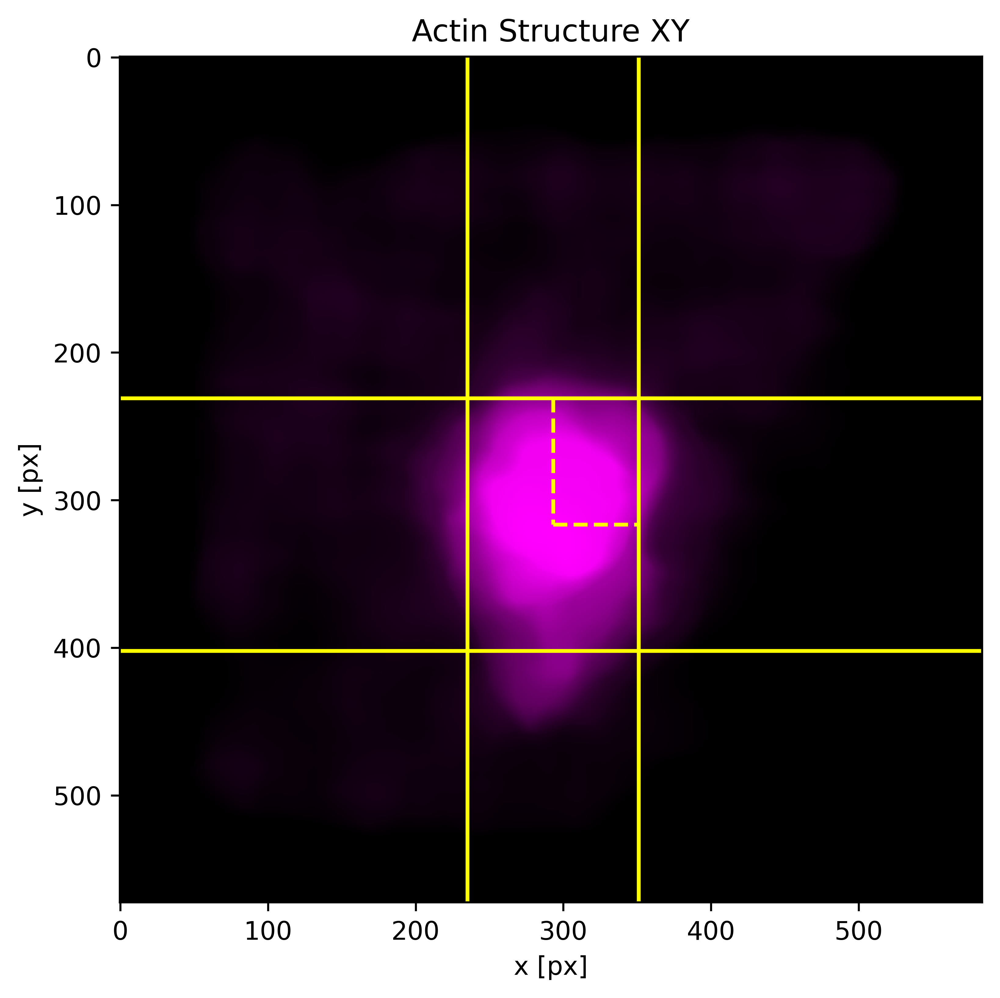

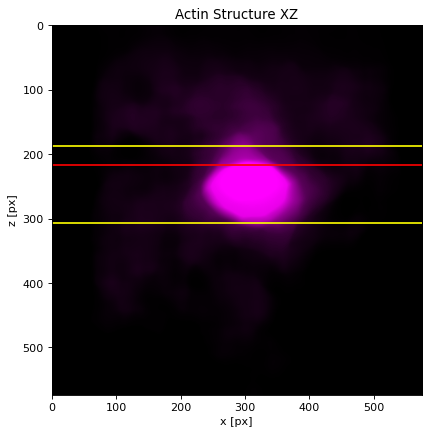

IMAGE ID 29


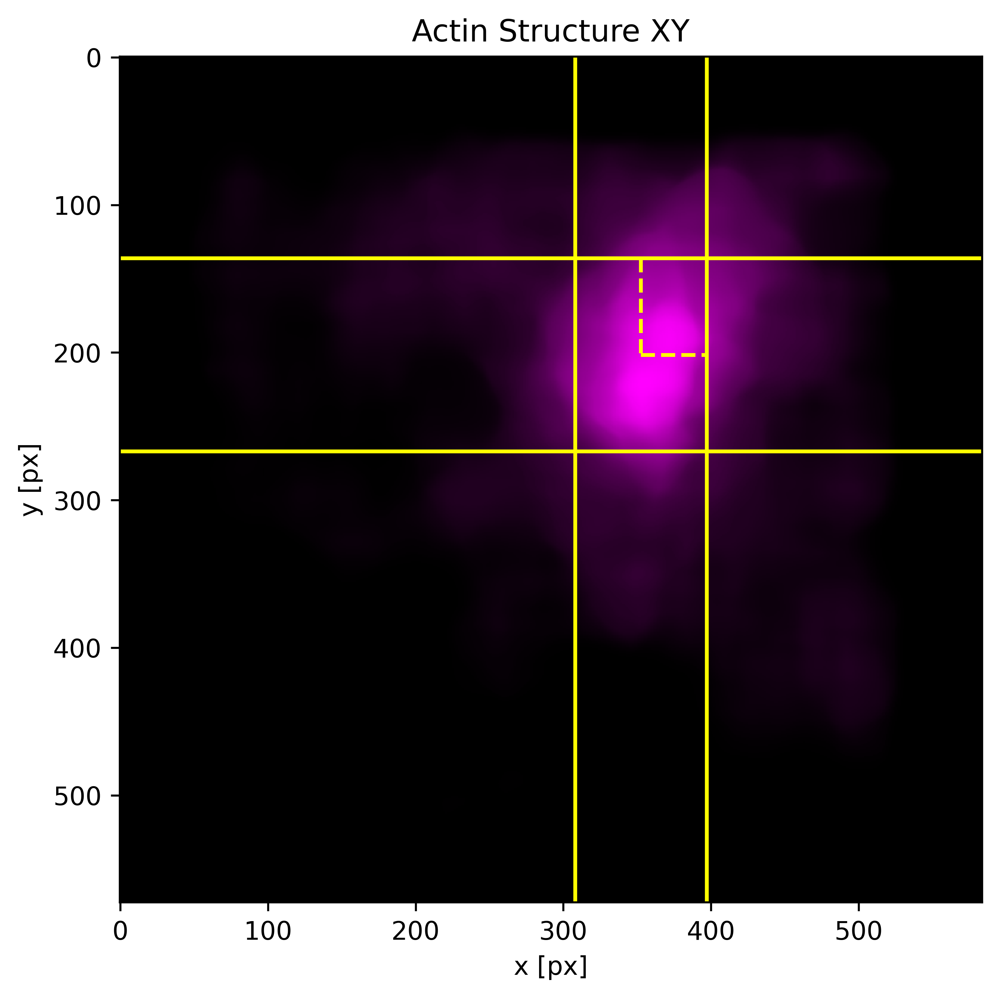

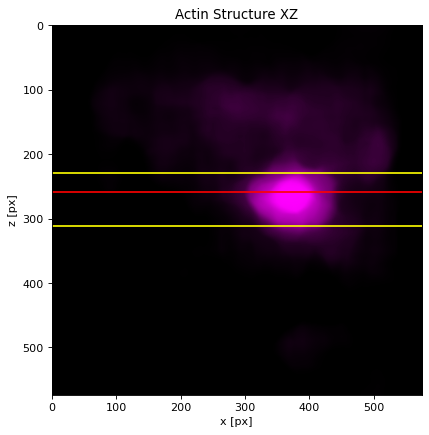

IMAGE ID 30


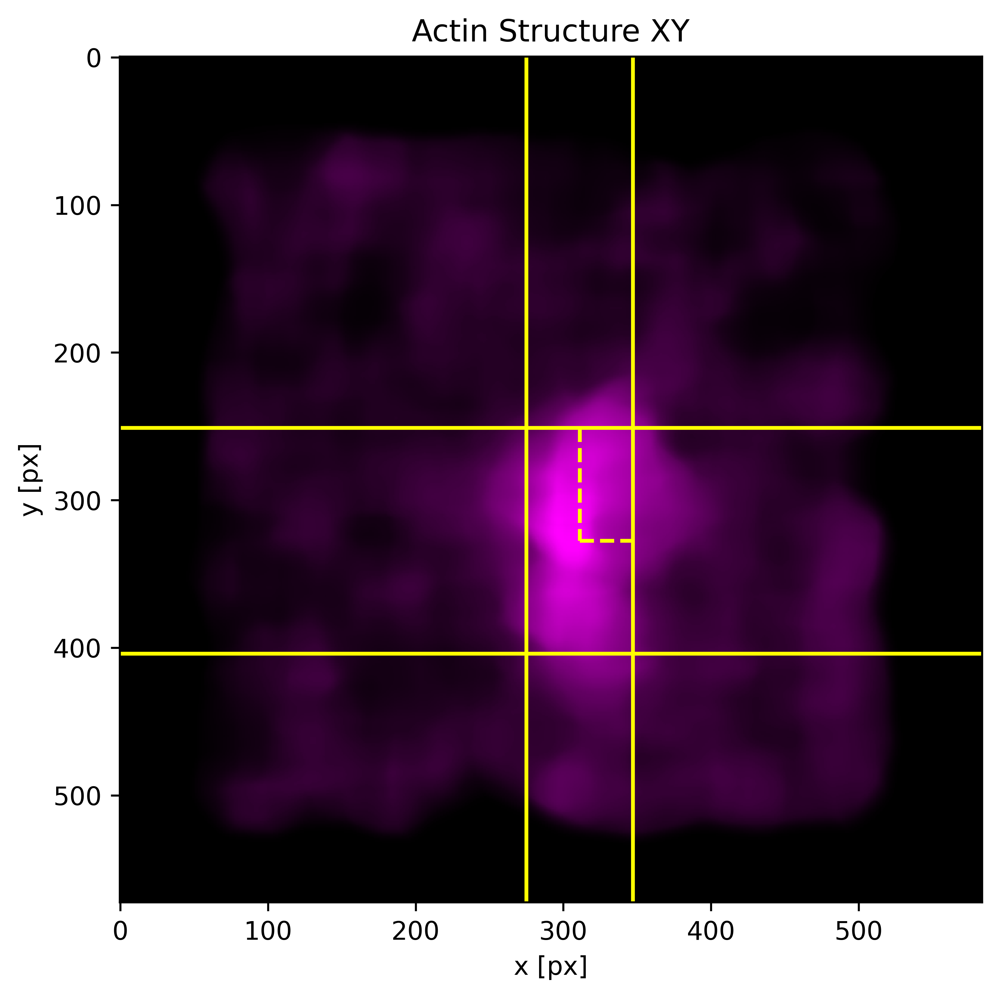

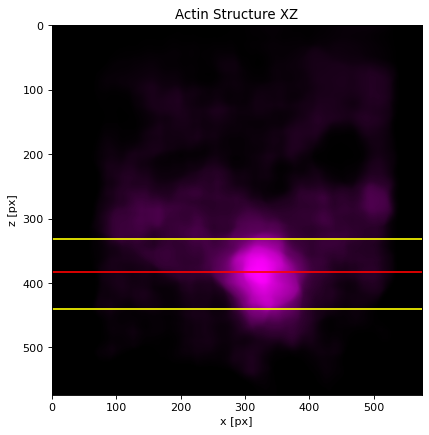

IMAGE ID 42


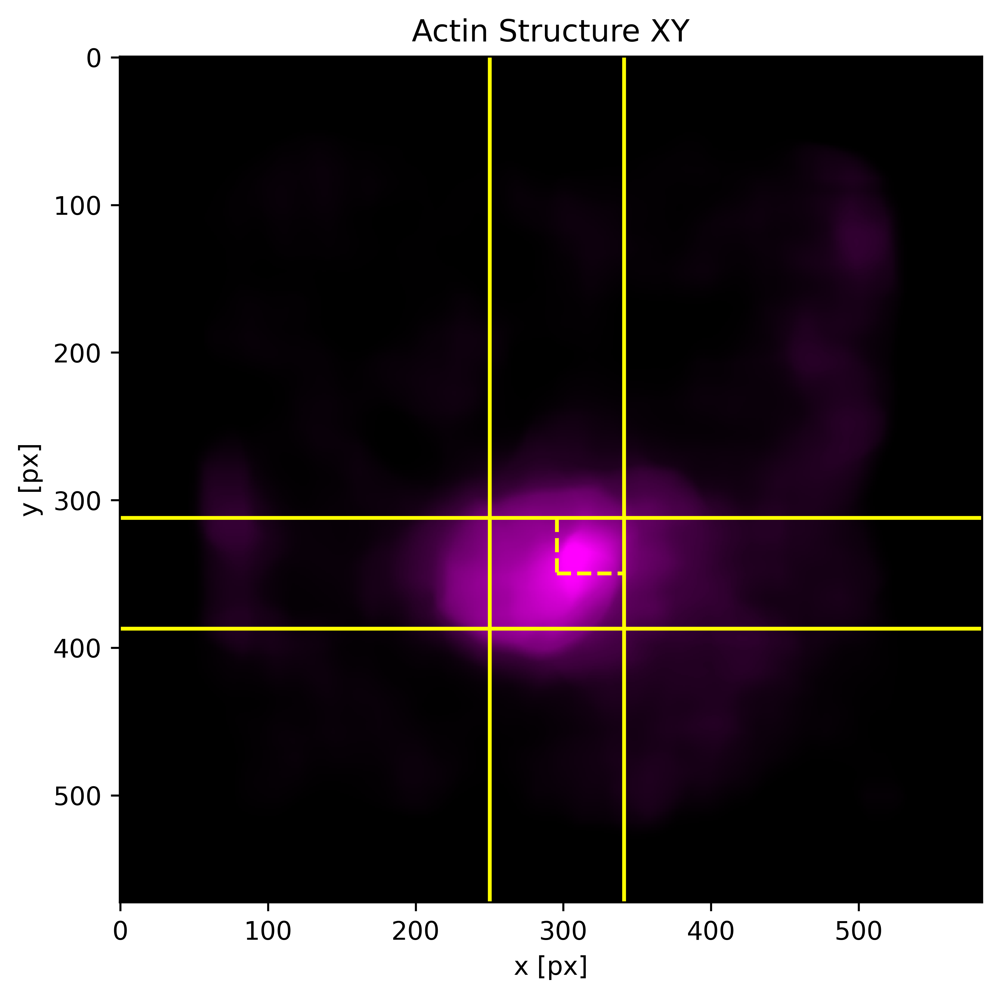

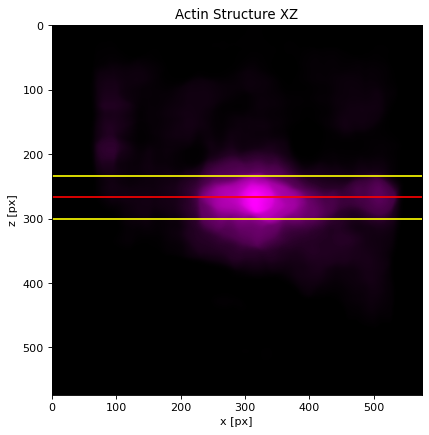

IMAGE ID 43


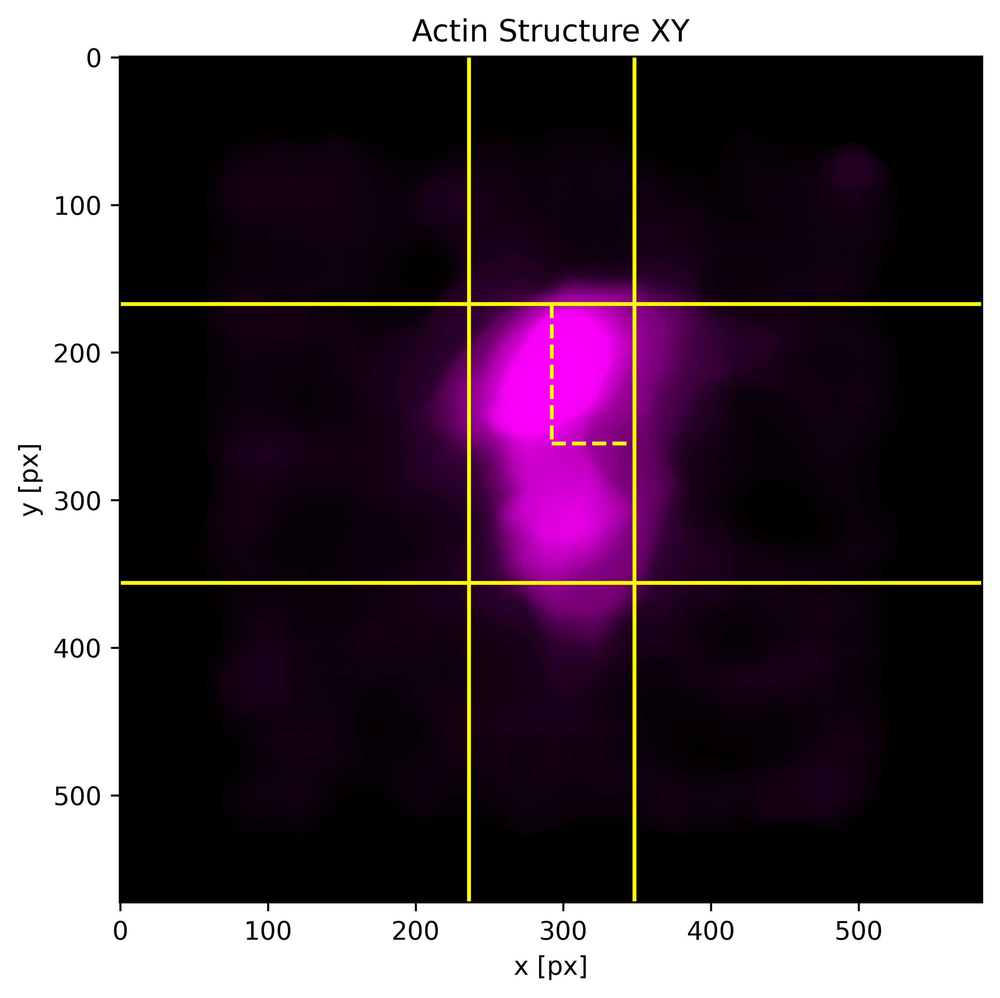

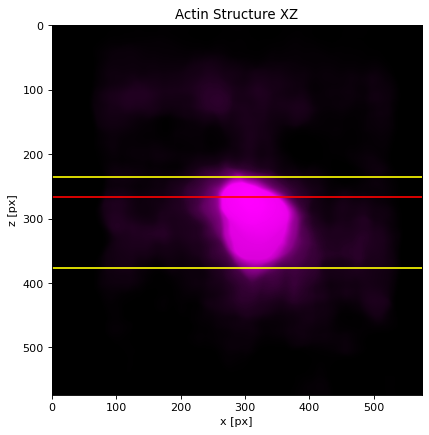

IMAGE ID 45


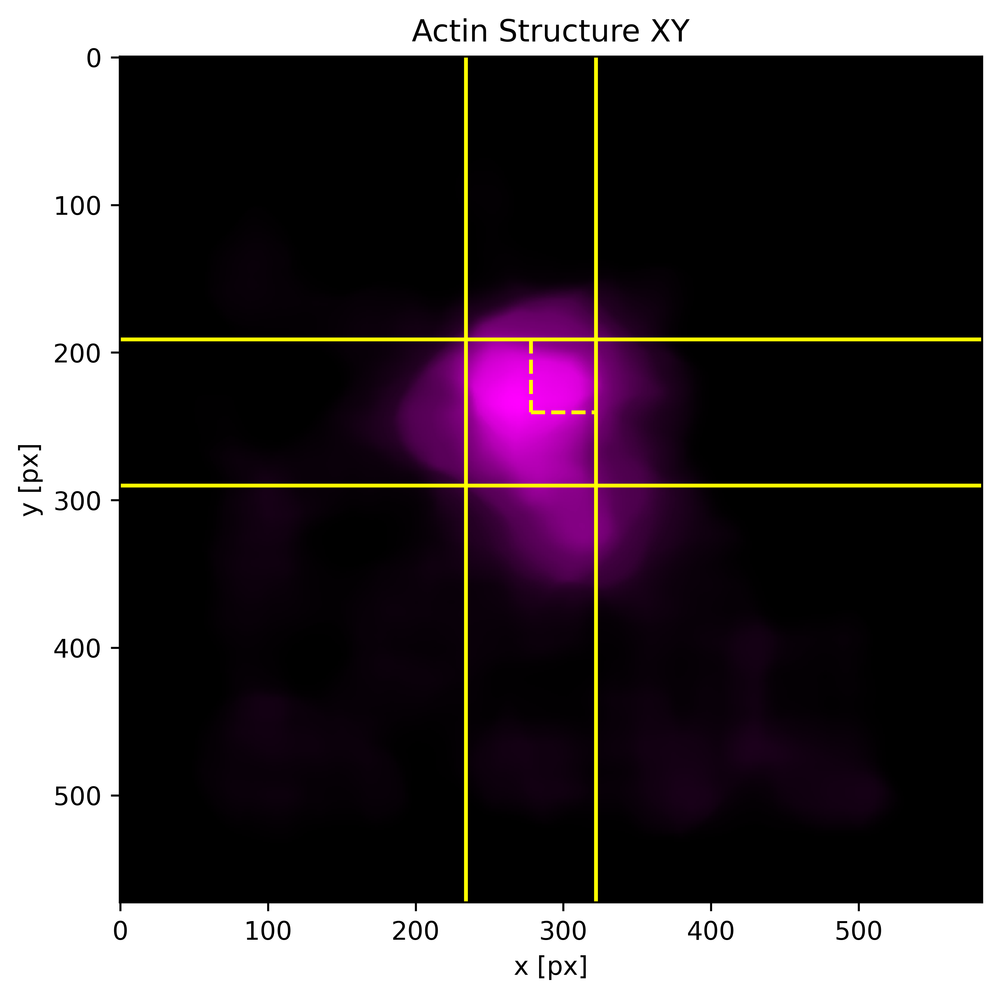

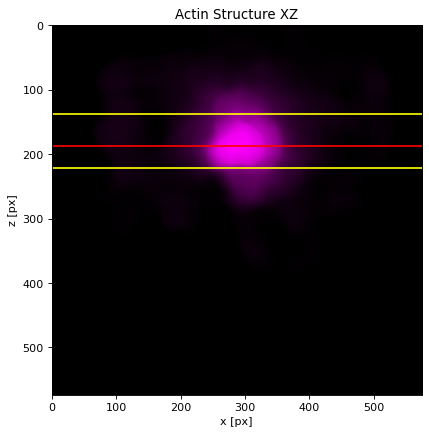

IMAGE ID 46


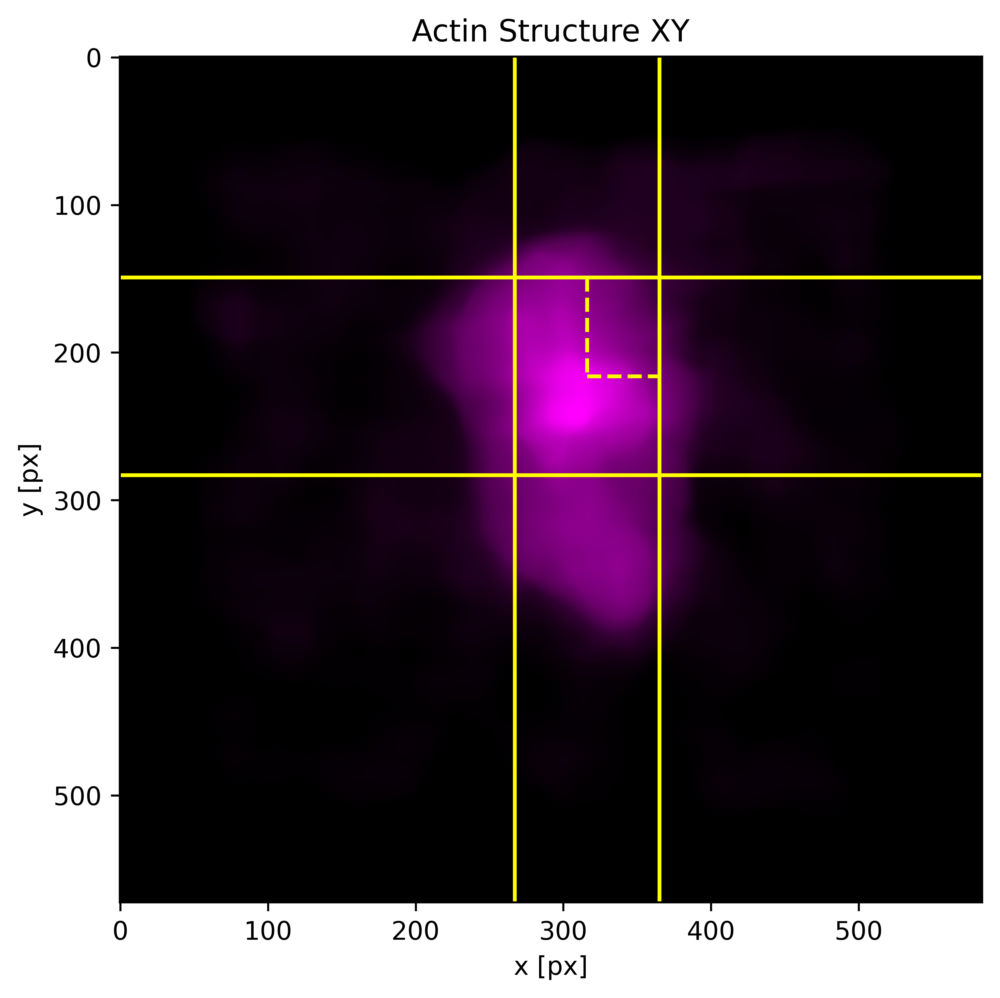

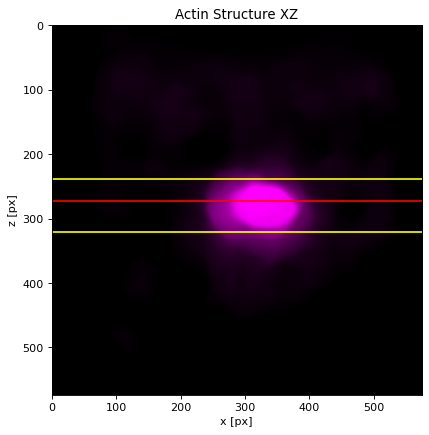

IMAGE ID 51


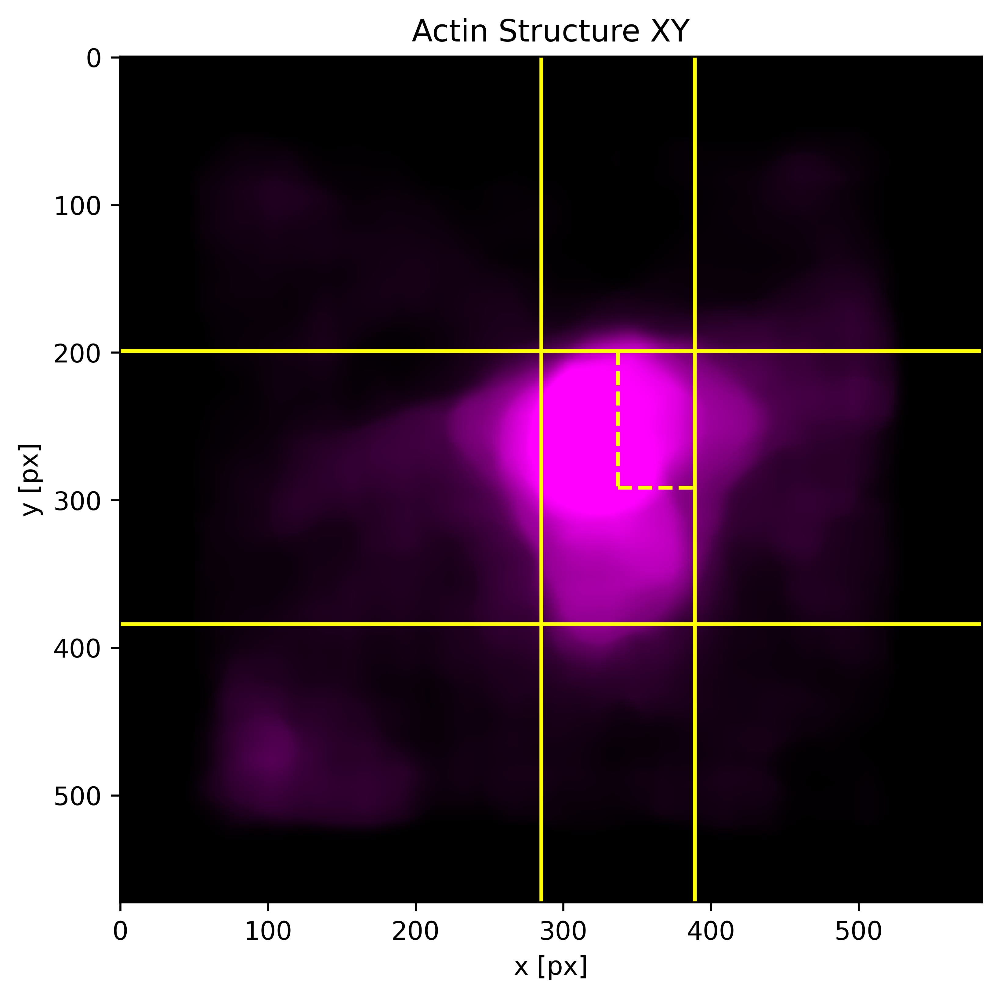

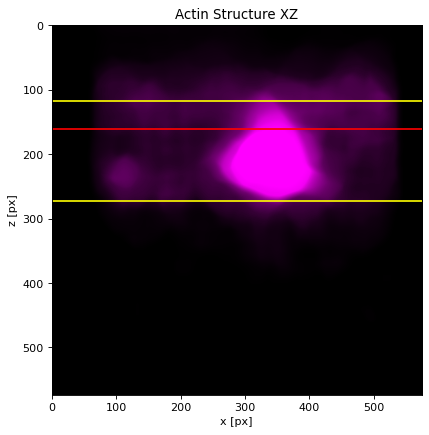

IMAGE ID 54


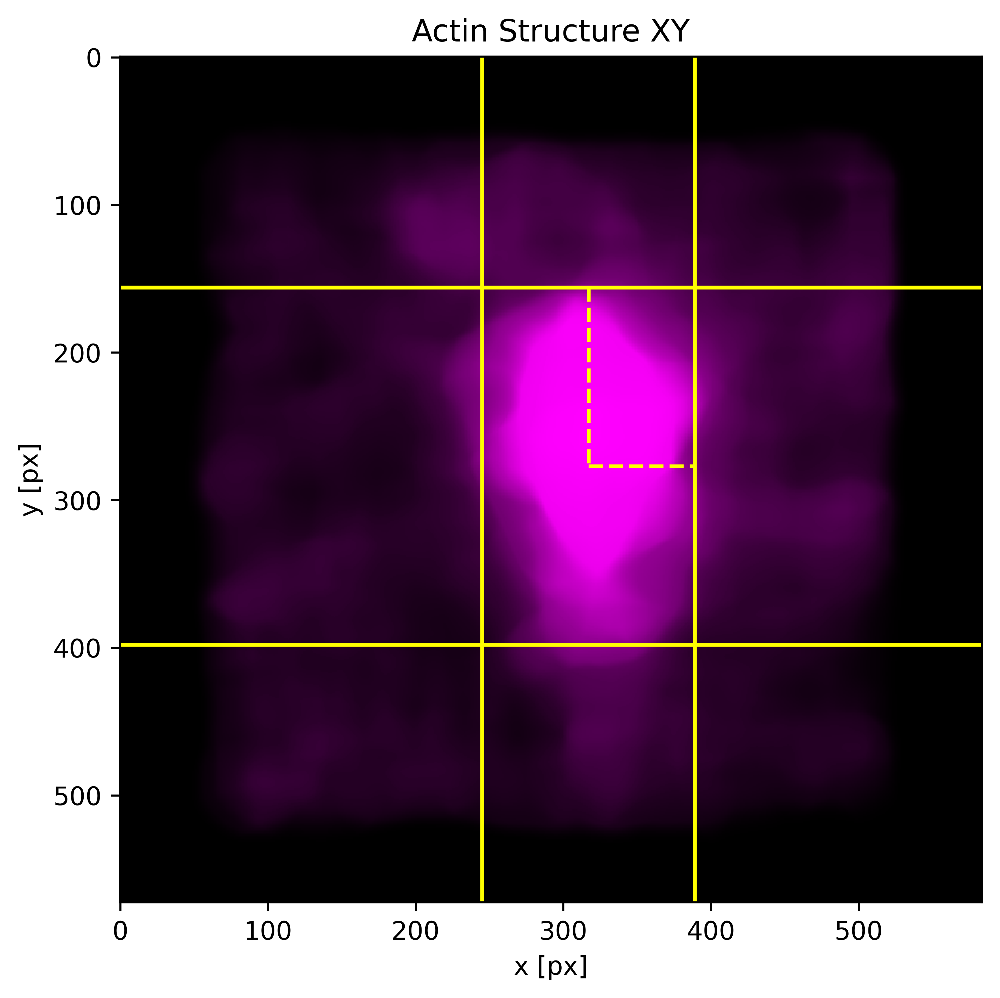

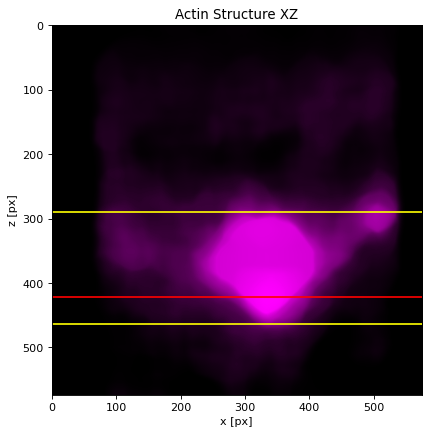

IMAGE ID 60


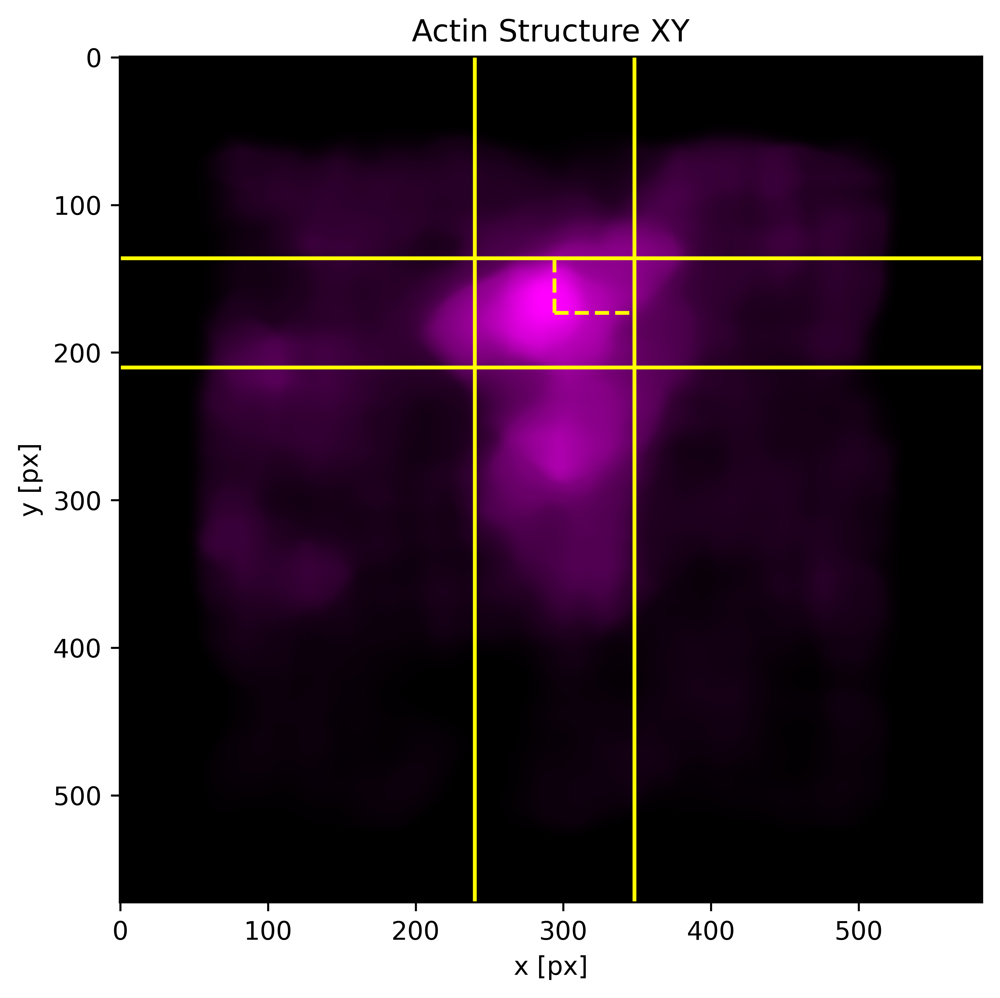

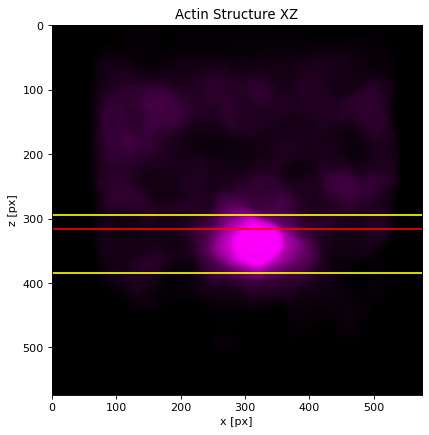

IMAGE ID 61


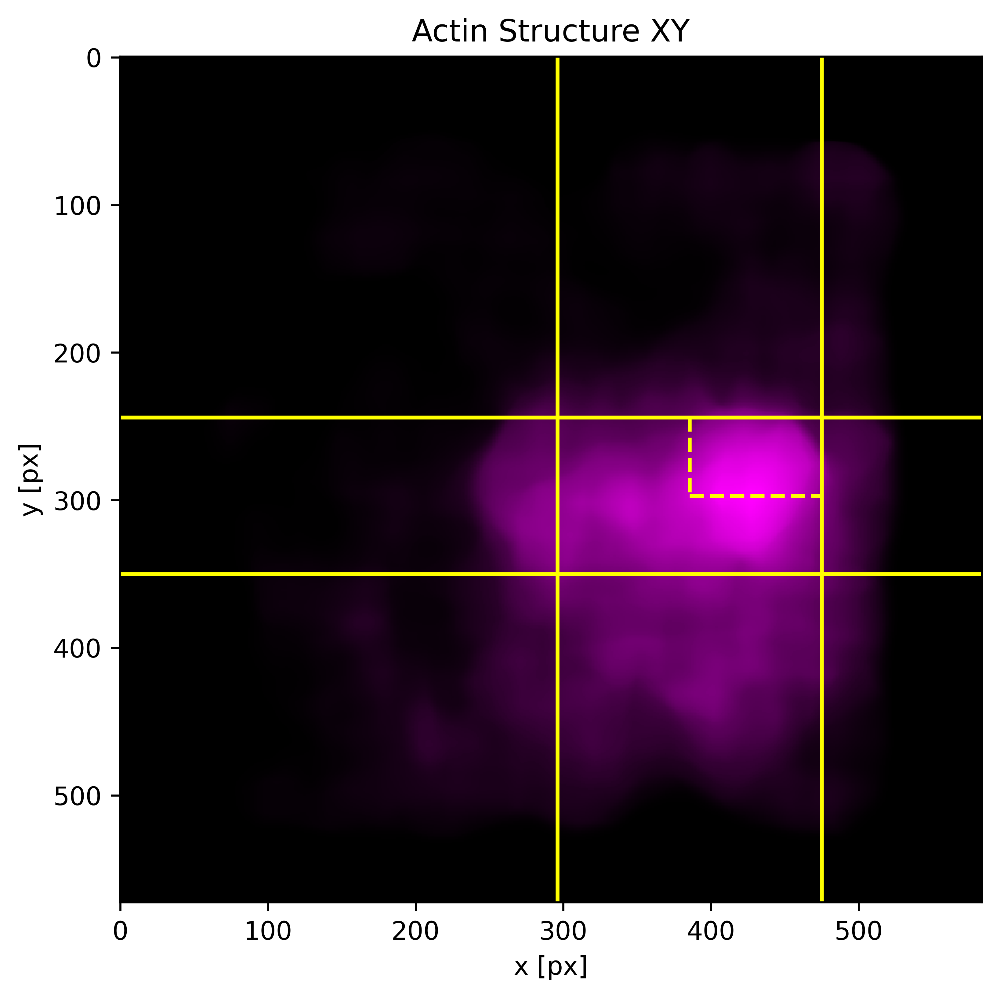

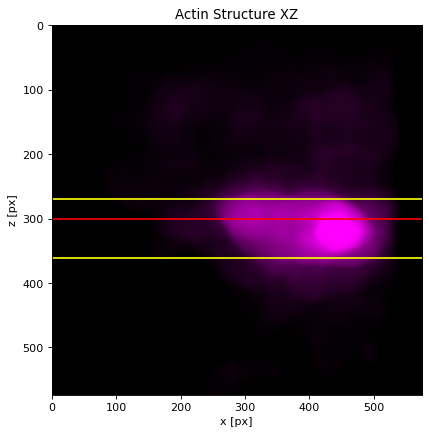

IMAGE ID 74


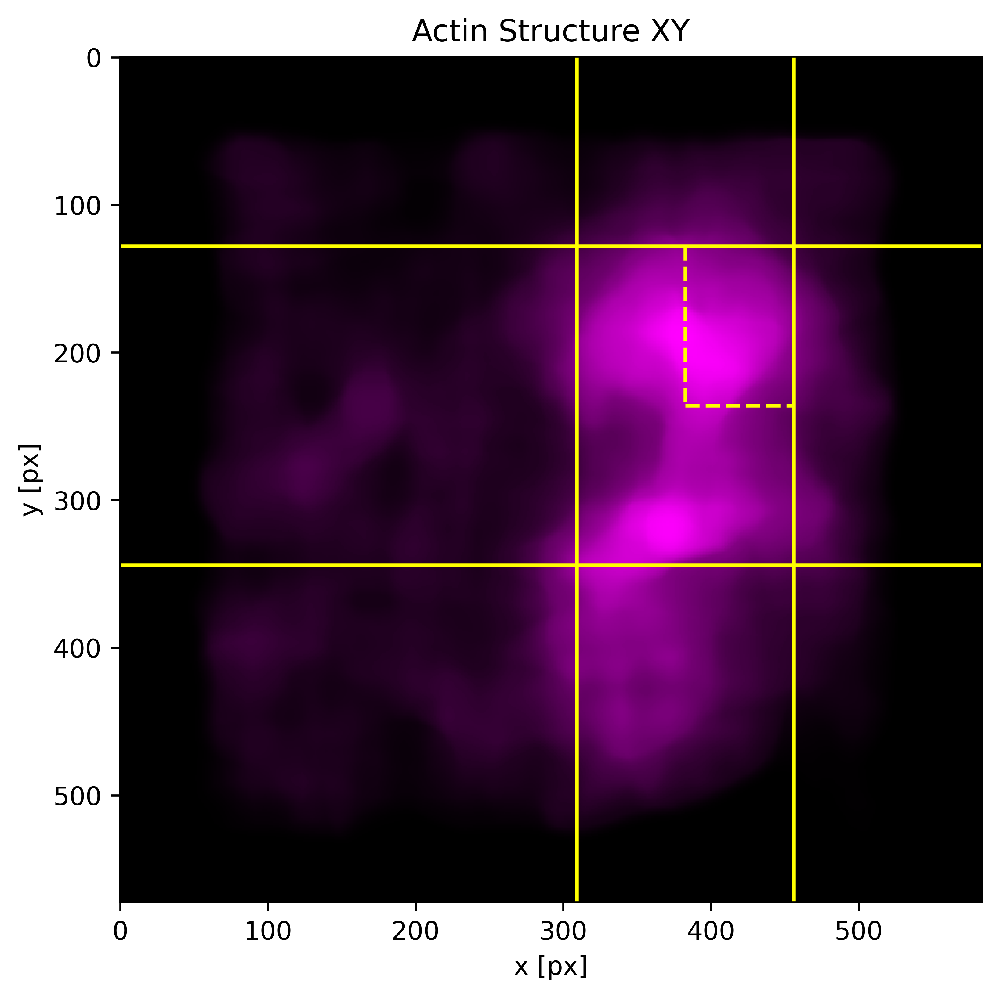

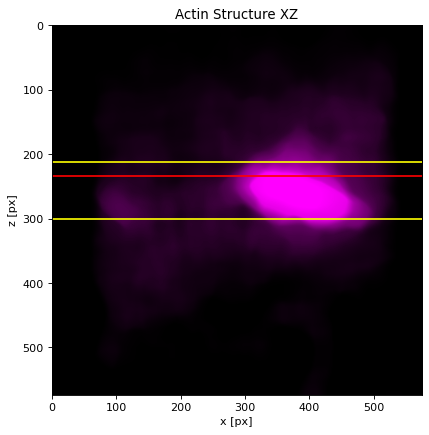

IMAGE ID 75


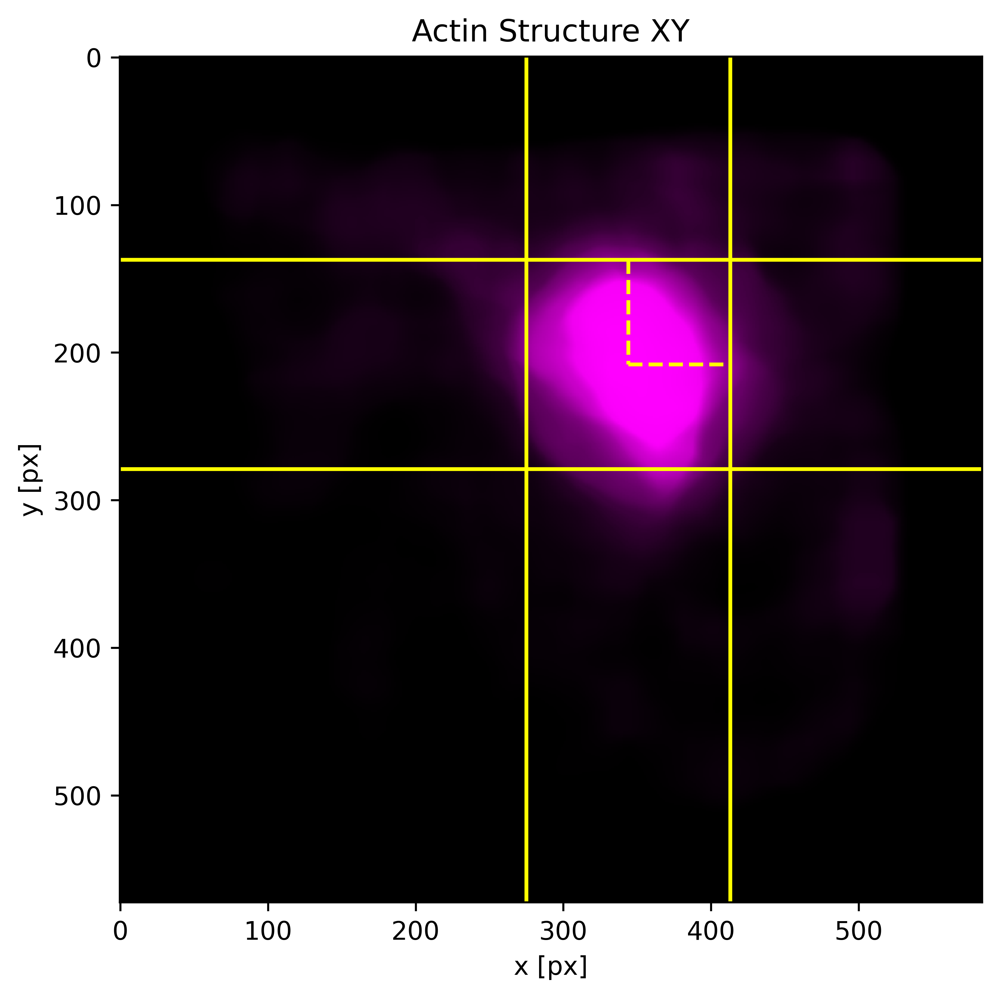

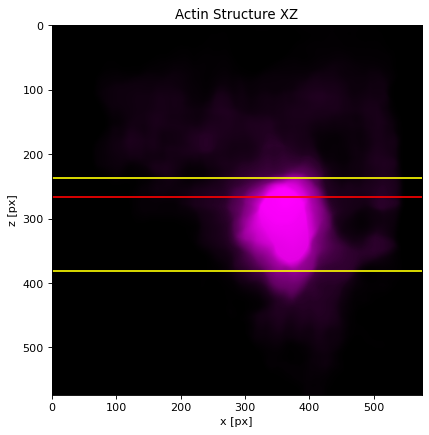

IMAGE ID 76


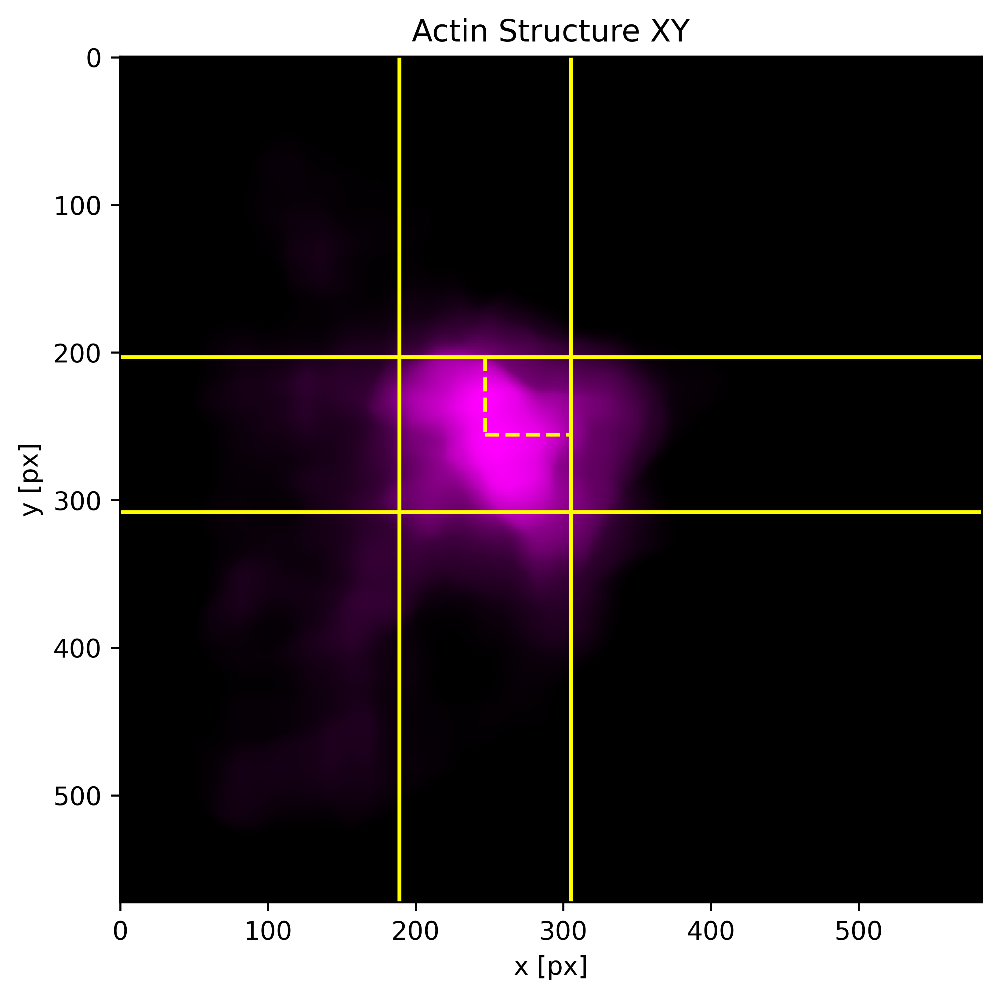

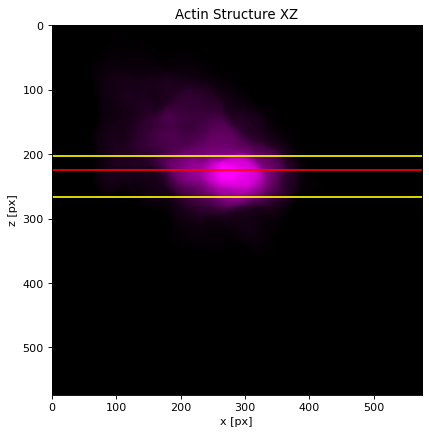

IMAGE ID 77


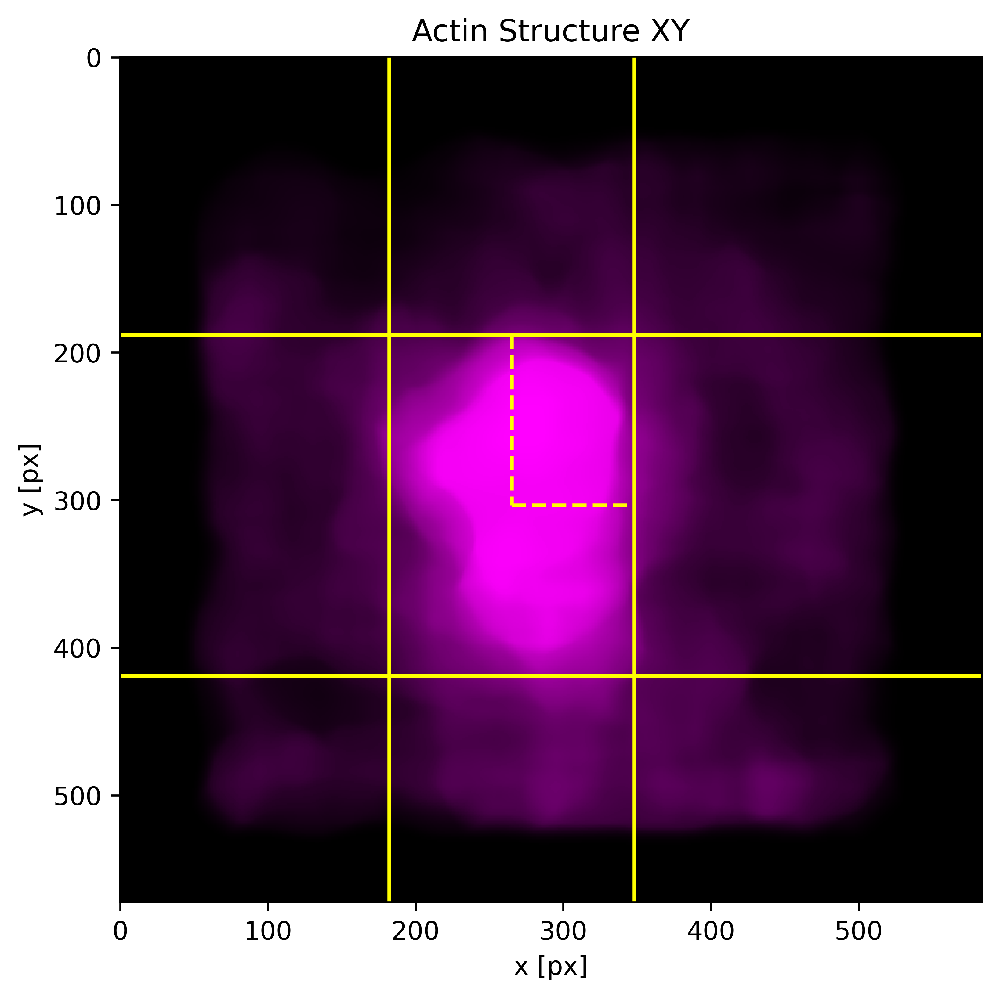

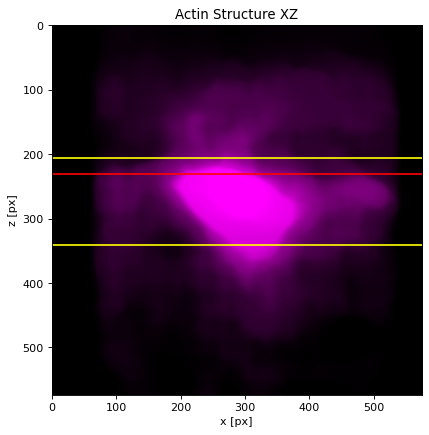

IMAGE ID 80


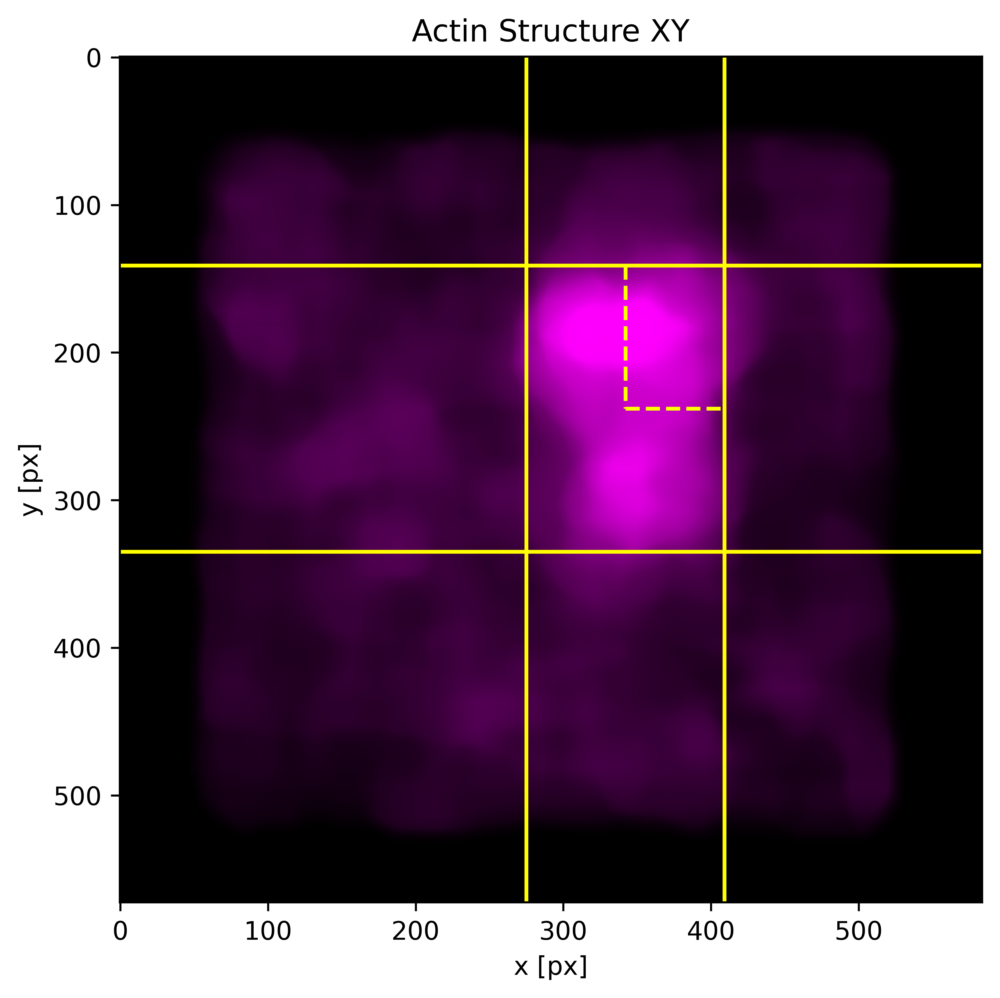

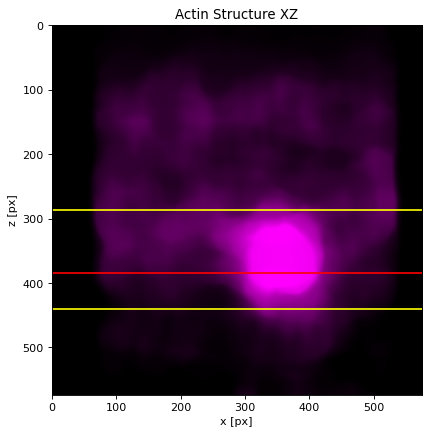

IMAGE ID 82


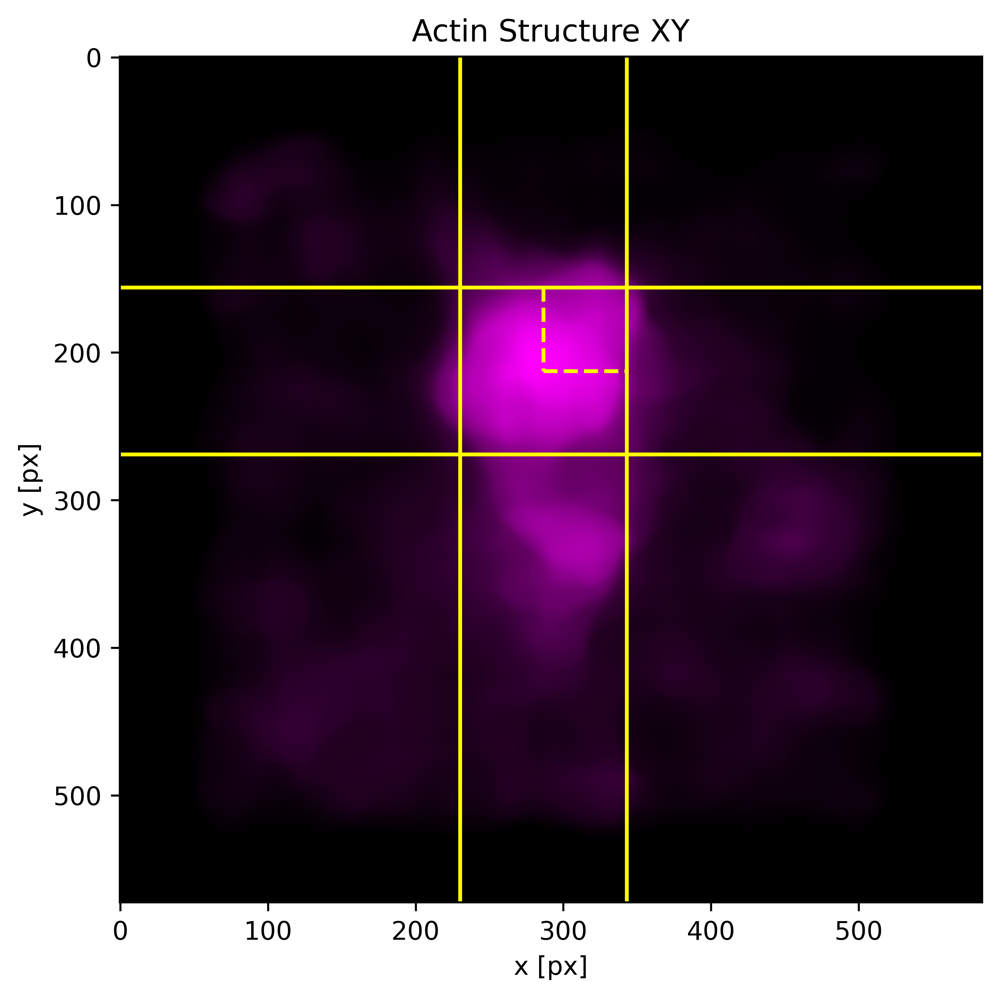

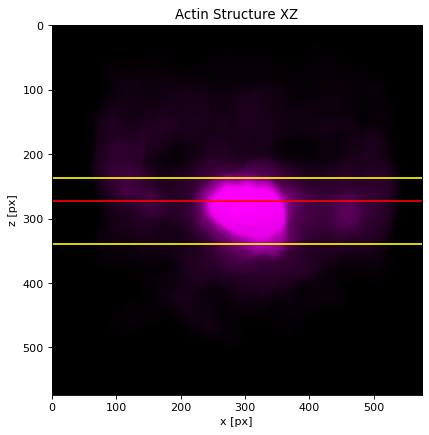

IMAGE ID 87


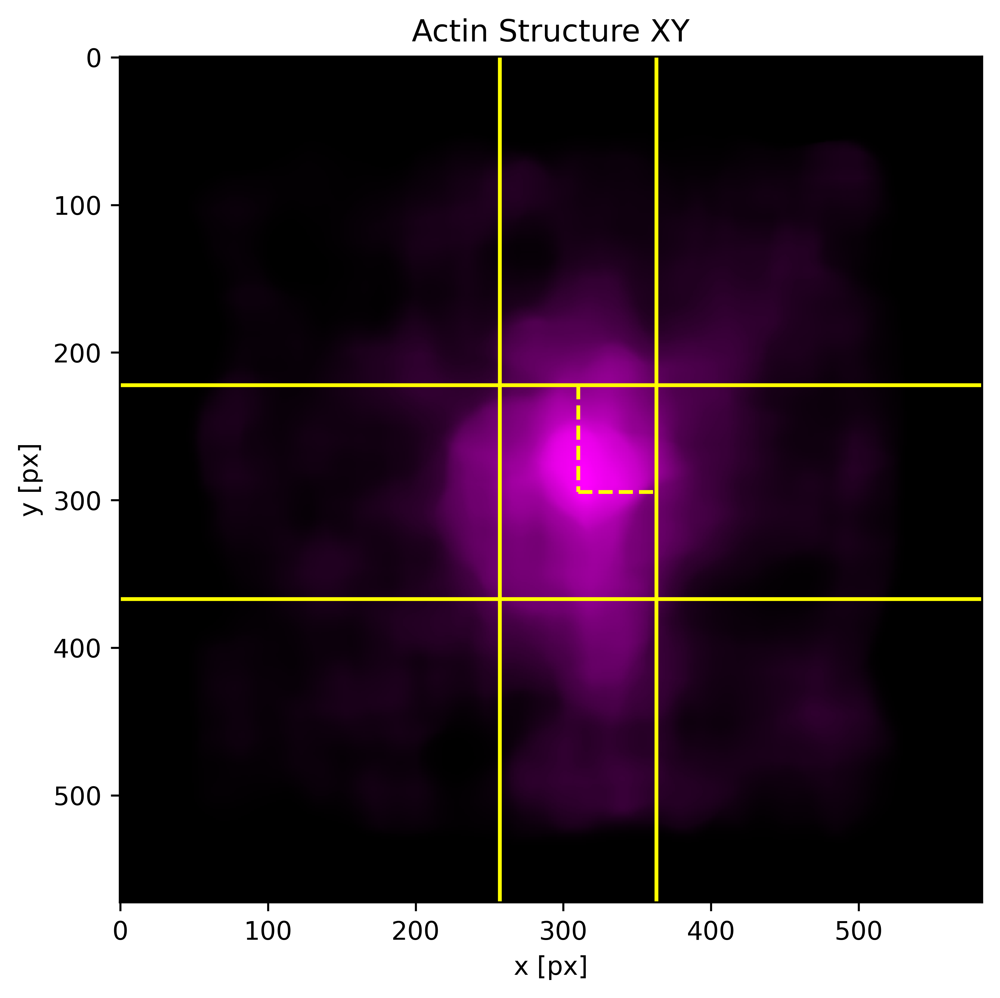

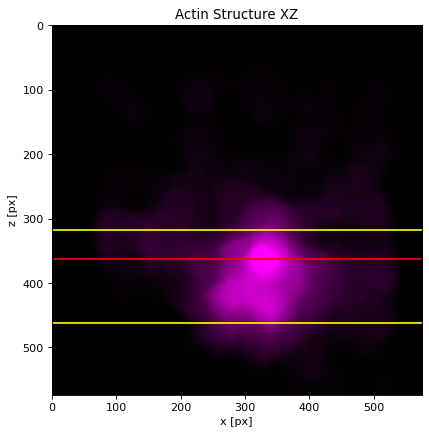

IMAGE ID 89


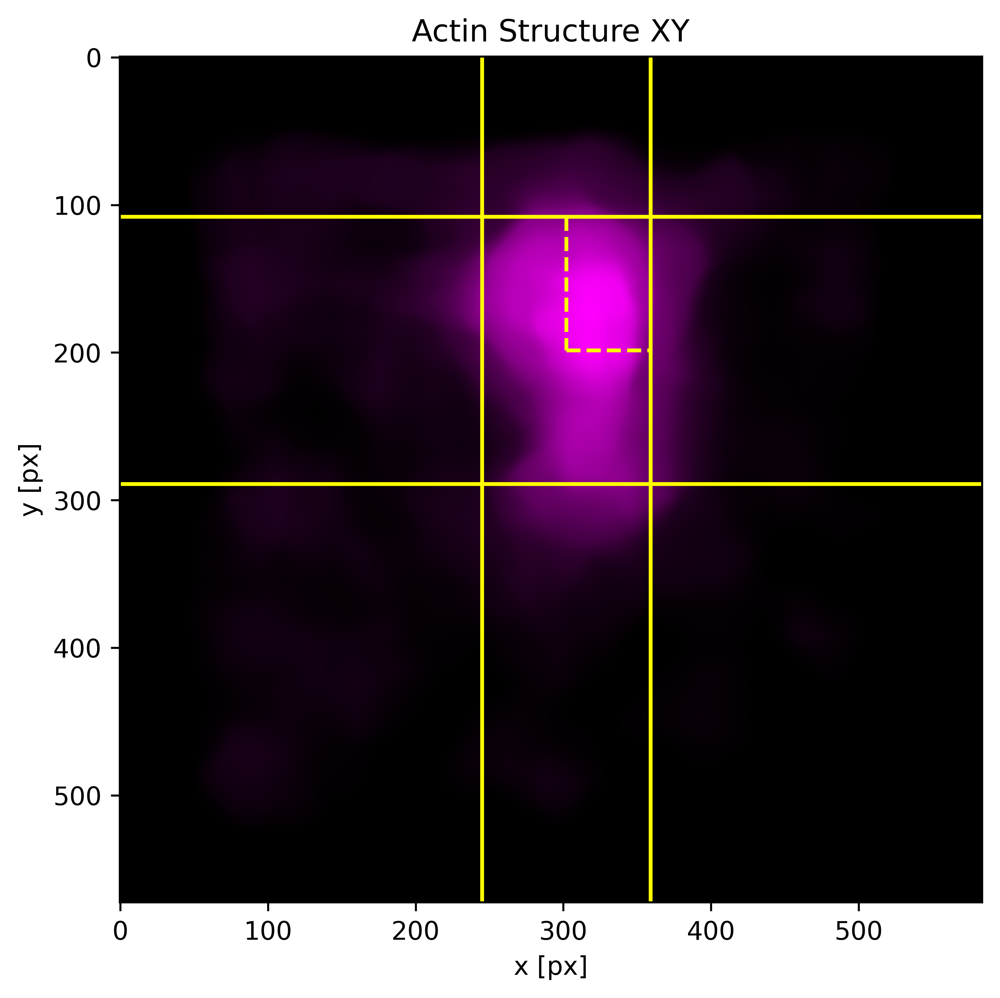

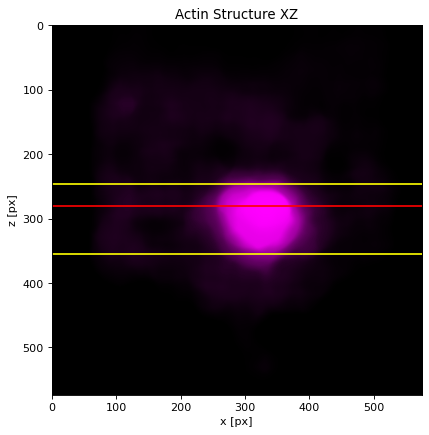

IMAGE ID 90


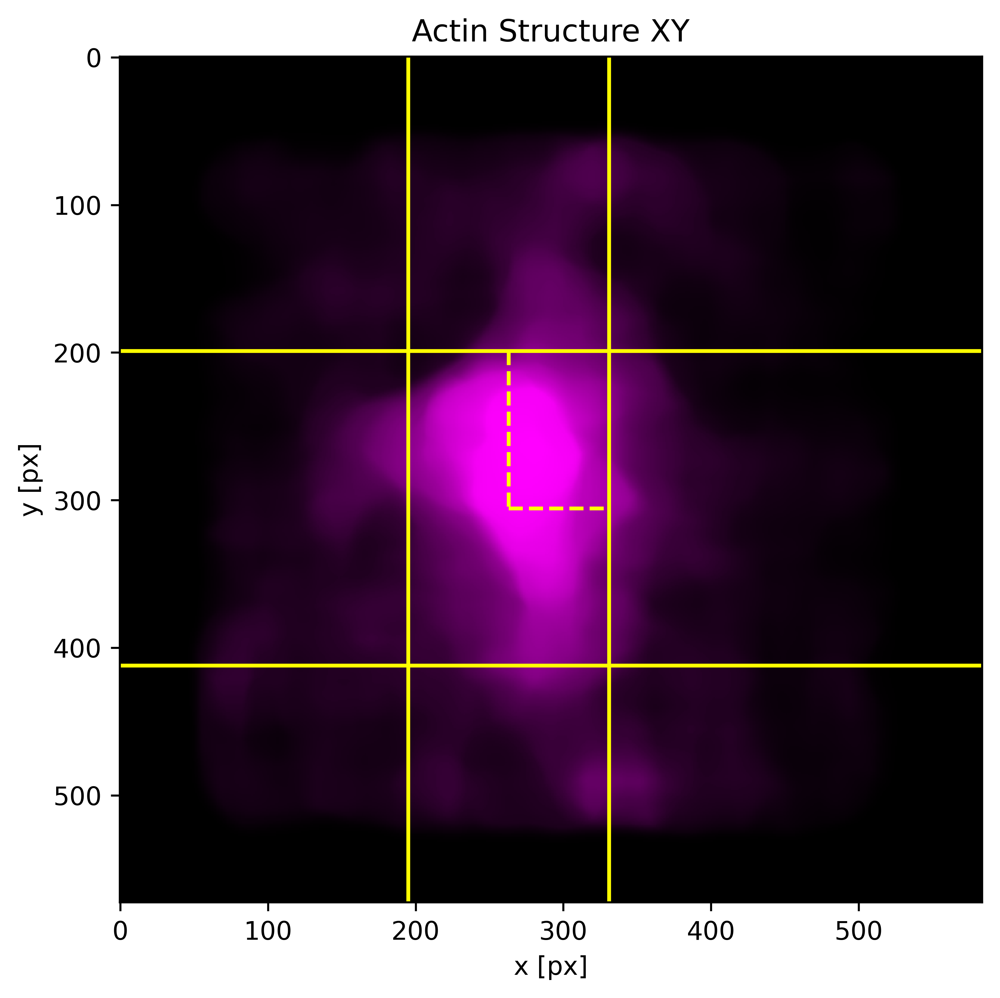

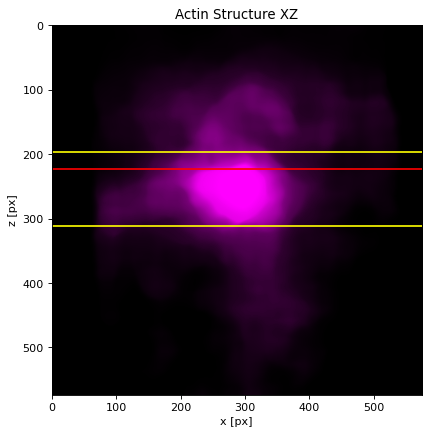

IMAGE ID 91


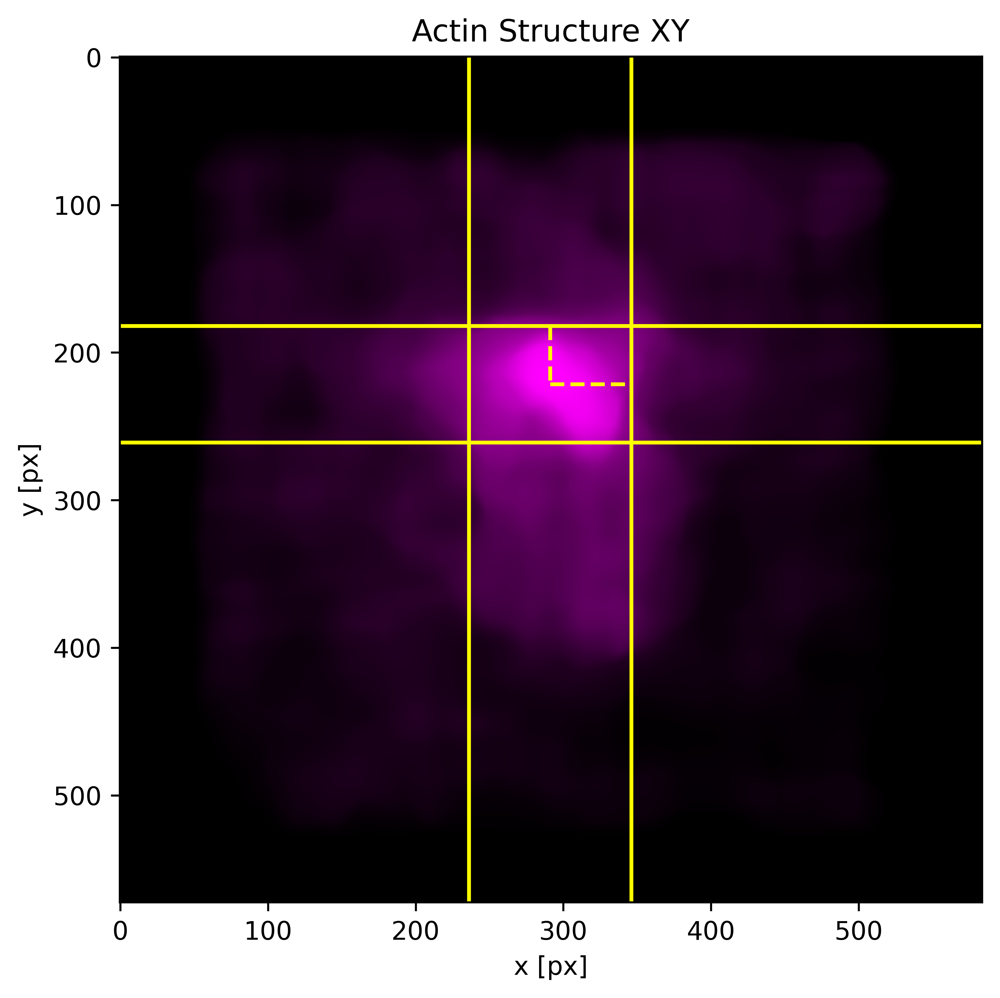

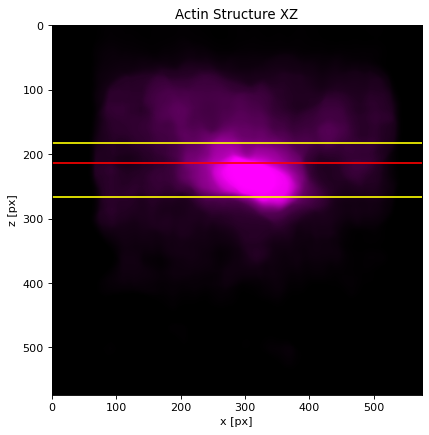

IMAGE ID 93


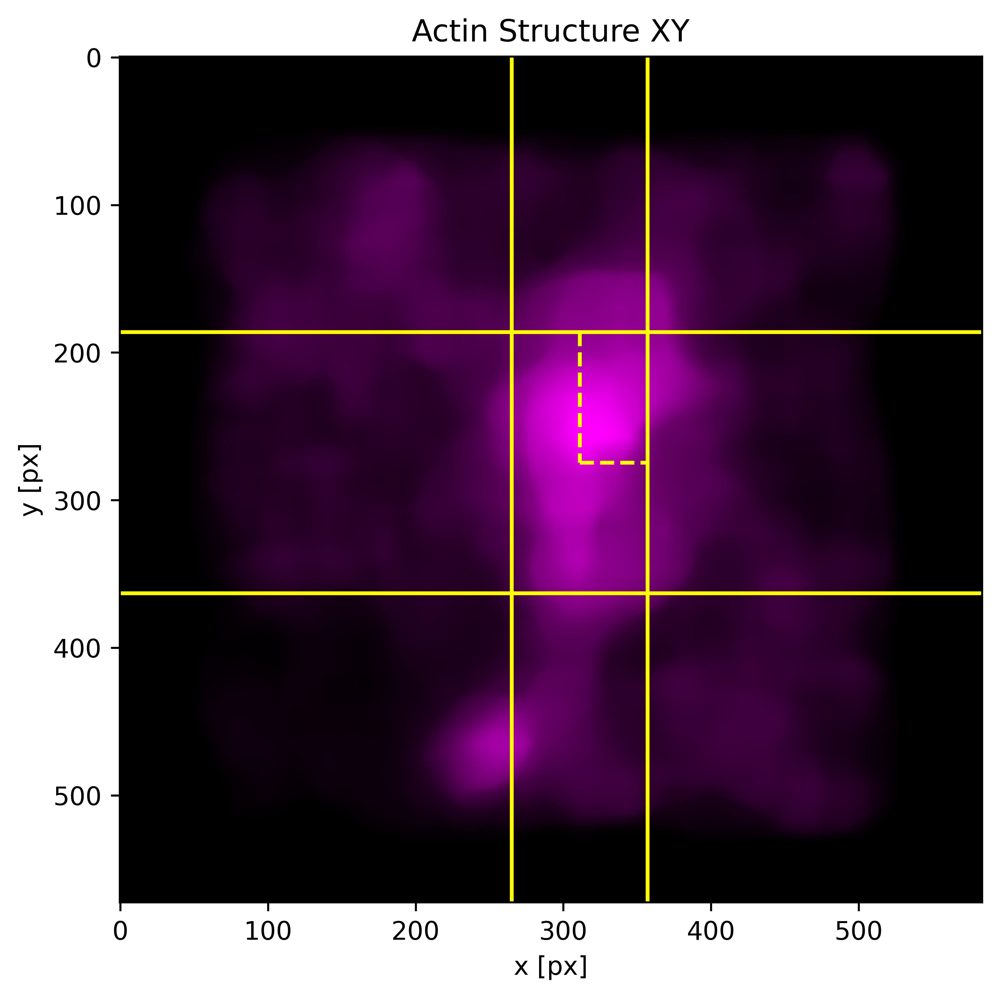

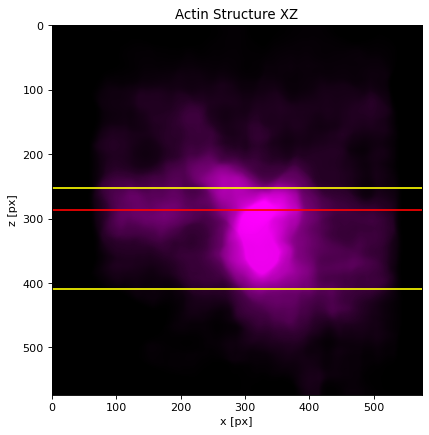

,ImageID,Actin structure XY,Actin structure XZ,Sac6,Rvs167,Sac6 Intensity,experimentID,X_index_upper,X_index_max,X_index_lower,...,Z_index_max,Z_index_lower,Z_spread,Z_total_intensity,Z_intensity_density,XY_avg_spread,XYZ_avg_spread,Center_X,Center_Y,Area_ellipse
0,7,1,1,1,1,16.5760,10,415,369,328,...,421,326,100,7929,57,63,75,371,208,3131
1,8,1,1,1,1,8.8221,10,364,321,286,...,240,199,59,10871,132,86,77,325,278,5223
2,11,1,1,1,1,72.3530,10,409,332,275,...,393,273,107,21606,145,106,107,342,298,8917
3,12,1,1,1,1,61.7140,10,436,361,319,...,237,216,54,12084,161,88,76,377,285,6121
4,13,1,1,1,1,38.8550,10,359,303,249,...,140,106,89,19326,157,79,82,304,199,4926
5,14,1,1,1,1,16.7640,10,431,377,316,...,207,168,61,13034,153,91,81,373,228,6594
6,18,1,1,1,1,11.8370,10,419,373,321,...,444,346,93,13106,101,75,81,370,222,4429
7,21,1,1,1,1,153.3500,10,382,310,225,...,214,195,67,15425,164,124,105,303,238,12156
8,27,1,1,1,1,86.0340,10,384,290,250,...,202,128,83,8531,73,79,80,317,235,4654
9,28,1,1,1,1,78.4810,10,351,297,235,...,217,187,87,19163,158,104,99,293,316,8302


In [5]:
## Extract parameter values for each good structure

# Generate arrays for output values
imageIDs = np.array(excel_clean['ImageID'].values).astype(int)

#pandas_computation_result_rows_header = 
pandas_computation_result_rows = []

experimentID_array = []
imageID_array = []
imageHeightInPixels_array = []

Y_index_upper_array = []
Y_index_max_array = []
Y_index_lower_array = []
Y_spread_array = []
Y_total_int_array = []
Y_int_density_array = []

X_index_upper_array = []
X_index_max_array = []
X_index_lower_array = []
X_spread_array = []
X_total_int_array = []
X_int_density_array = []

Z_index_upper_array = []
Z_index_max_array = []
Z_index_lower_array = []
Z_spread_array = []
Z_total_int_array = []
Z_int_density_array = []

XY_avg_spread_array = []
XYZ_avg_spread_array = []
XY_center_X_array = []
XY_center_Y_array = []
Area_ellipse_array = []

# iterate through the good structures and extract parameter values
for imageID in imageIDs:
    
    dataRow = excel_clean[excel_clean['ImageID'] == imageID]
    
    histogramValuesAccumulator = []
            
    experimentID_array.append(experimentID)
    imageID_array.append(imageID)
    
    ### load images and apply a median filter to current structure #######################################
    print("IMAGE ID",imageID)
    XY_filename = XY_filename_prefix+("%02d" % (imageID,))+".png"
    XZ_filename = XZ_filename_prefix+("%02d" % (imageID,))+".png"
    
    XY_grey,XZ_grey = importImage(XY_filename,XZ_filename)
    
    XY_grey_median = scipy.ndimage.median_filter(XY_grey, medianFilterSize)
    XZ_grey_median = scipy.ndimage.median_filter(XZ_grey, medianFilterSize)
    
    #extract parameter values for current structure
    XYZ_indexes, histo_X, histo_Y, histo_Z = get_max_indexes_and_histos(XY_grey_median, XZ_grey_median, thresholdForWidth)
    
    X_total_int, X_int_density = get_intensity_density(histo_X, XYZ_indexes[0], XYZ_indexes[2])
    Y_total_int, Y_int_density = get_intensity_density(histo_Y, XYZ_indexes[3], XYZ_indexes[5])
    Z_total_int, Z_int_density = get_intensity_density(histo_Z, XYZ_indexes[6], XYZ_indexes[8])
    
    #append parameter values for current structure to parameter arrays
    X_index_lower_array.append(XYZ_indexes[0])
    X_index_max_array.append(XYZ_indexes[1])
    X_index_upper_array.append(XYZ_indexes[2])
    X_spread = (XYZ_indexes[2] - XYZ_indexes[0])*factor_nm
    X_spread_array.append(X_spread)
    X_total_int_array.append(X_total_int)
    X_int_density_array.append(X_int_density)
    Y_index_lower_array.append(XYZ_indexes[3])
    Y_index_max_array.append(XYZ_indexes[4])
    Y_index_upper_array.append(XYZ_indexes[5])
    Y_spread = (XYZ_indexes[5] - XYZ_indexes[3])*factor_nm
    Y_spread_array.append(Y_spread)
    Y_total_int_array.append(Y_total_int)
    Y_int_density_array.append(Y_int_density)
    Z_index_lower_array.append(XYZ_indexes[6])
    Z_index_max_array.append(XYZ_indexes[7])
    Z_index_upper_array.append(XYZ_indexes[8])
    Z_spread = (XYZ_indexes[8] - XYZ_indexes[6])*factor_nm
    Z_spread_array.append(Z_spread)
    Z_total_int_array.append(Z_total_int)
    Z_int_density_array.append(Z_int_density)
    XY_avg_spread = (X_spread+Y_spread)/2
    XY_avg_spread_array.append(XY_avg_spread)
    XYZ_avg_spread = (X_spread+Y_spread+Z_spread)/3
    XYZ_avg_spread_array.append(XYZ_avg_spread)
    XY_center_X = XYZ_indexes[2]-((X_spread/factor_nm)/2)
    XY_center_X_array.append(XY_center_X)
    XY_center_Y = XYZ_indexes[5]-((Y_spread/factor_nm)/2)
    XY_center_Y_array.append(XY_center_Y)
    Area_ellipse = m.pi*(X_spread/2)*(Y_spread/2)
    Area_ellipse_array.append(Area_ellipse)
    
    
    #plot XY and YZ images with axis lines at max, upper, and lower indexes
    if dark_plot_style == True:
        plt.style.use('dark_background')
    
    plt.figure(num=None, figsize=(8, 6), dpi=600, facecolor='w', edgecolor='k')
    plt.imshow(XY_grey_median / XY_grey_median.max(), cmap = black2magenta,alpha=1)
    plt.axvline(XYZ_indexes[0], c='yellow')
    #plt.axvline(XYZ_indexes[1], c='red')
    plt.axvline(XYZ_indexes[2], c='yellow')
    plt.axhline(XYZ_indexes[3], c='yellow')
    #plt.axhline(XYZ_indexes[4], c='red')
    plt.axhline(XYZ_indexes[5], c='yellow')
    plt.plot([XY_center_X,XY_center_X],[XYZ_indexes[3],XY_center_Y], c='yellow', linestyle='dashed')
    plt.plot([XY_center_X,XYZ_indexes[2]],[XY_center_Y,XY_center_Y], c='yellow', linestyle='dashed')
    plt.ylabel("y [px]")
    plt.xlabel("x [px]")
    plt.title("Actin Structure XY")
    plt.savefig(output_folder+"XY_magenta_"+("%02d" % (imageID,))+".png")
    plt.show()
    if show_images == False:
        plt.close()
        
    plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
    plt.imshow(XZ_grey_median / XZ_grey_median.max(), cmap = black2magenta,alpha=1)
    plt.axhline(XYZ_indexes[6], c='yellow')
    plt.axhline(XYZ_indexes[7], c='red')
    plt.axhline(XYZ_indexes[8], c='yellow')
    plt.ylabel("z [px]")
    plt.xlabel("x [px]")
    plt.title("Actin Structure XZ")
    #plt.savefig(output_folder+"XZ_magenta_"+("%02d" % (imageID,))+".png")
    plt.show()
    if show_images == False:
        plt.close()
        
resultdf = pd.DataFrame()


resultdf['experimentID']=np.array(experimentID_array).astype(int)
resultdf['ImageID']=np.array(imageID_array).astype(int)

resultdf['X_index_upper']=np.array(X_index_upper_array).astype(int)
resultdf['X_index_max']=np.array(X_index_max_array).astype(int)
resultdf['X_index_lower']=np.array(X_index_lower_array).astype(int)
resultdf['X_spread']=np.array(X_spread_array).astype(int)
resultdf['X_total_intensity']=np.array(X_total_int_array).astype(int)
resultdf['X_intensity_density']=np.array(X_int_density_array).astype(int)

resultdf['Y_index_upper']=np.array(Y_index_upper_array).astype(int)
resultdf['Y_index_max']=np.array(Y_index_max_array).astype(int)
resultdf['Y_index_lower']=np.array(Y_index_lower_array).astype(int)
resultdf['Y_spread']=np.array(Y_spread_array).astype(int)
resultdf['Y_total_intensity']=np.array(Y_total_int_array).astype(int)
resultdf['Y_intensity_density']=np.array(Y_int_density_array).astype(int)

resultdf['Z_index_upper']=np.array(Z_index_upper_array).astype(int)
resultdf['Z_index_max']=np.array(Z_index_max_array).astype(int)
resultdf['Z_index_lower']=np.array(Z_index_lower_array).astype(int)
resultdf['Z_spread']=np.array(Z_spread_array).astype(int)
resultdf['Z_total_intensity']=np.array(Z_total_int_array).astype(int)
resultdf['Z_intensity_density']=np.array(Z_int_density_array).astype(int)

resultdf['XY_avg_spread']=np.array(XY_avg_spread_array).astype(int)
resultdf['XYZ_avg_spread']=np.array(XYZ_avg_spread_array).astype(int)
resultdf['Center_X']=np.array(XY_center_X_array).astype(int)
resultdf['Center_Y']=np.array(XY_center_Y_array).astype(int)
resultdf['Area_ellipse']=np.array(Area_ellipse_array).astype(int)



        
# save all parameter values to csv
pd.options.mode.chained_assignment = None  # default='warn'
excel_clean['ImageID'] = excel_clean['ImageID'].astype(int)
fullDataset = pd.merge(excel_clean, resultdf,  on=['ImageID']) #how='inner',
fullDataset.to_csv(output_folder+output_filename+'.csv')

fullDataset


In [6]:
print(histo_X)
print(XYZ_indexes[0])
print(XYZ_indexes[2])

[  0.      0.      0.      0.      0.      0.      0.      0.      0.
   0.      0.      0.      0.      0.      0.      0.      0.      0.
   0.      0.      0.      0.      0.      0.      0.      0.      0.
   0.      0.      0.      0.      0.      0.      0.      0.      0.
   0.      0.      0.      0.      0.      0.      0.      0.      0.
   0.587   0.701   1.288   1.761   2.348   3.049   3.75    4.337   4.924
   5.511   5.967   6.799   7.5     8.343   9.158   9.928  10.874  11.82
  12.538  13.45   14.134  14.966  15.641  16.288  16.744  17.348  17.69
  18.243  18.604  18.961  19.337  19.582  19.793  20.135  20.215  20.608
  20.819  21.178  21.44   21.668  22.01   22.141  22.141  22.255  22.352
  22.369  22.255  22.255  22.255  22.141  22.141  22.141  21.913  21.896
  21.896  21.896  22.01   22.141  22.141  22.369  22.614  22.728  23.053
  23.298  23.543  23.754  23.999  24.016  23.999  23.885  23.657  23.543
  23.429  23.315  23.141  23.053  22.939  22.842  22.728  22.706  22

In [7]:
total_int_X = 0
for px in range(XYZ_indexes[0], XYZ_indexes[2]+1):
    total_int_X = total_int_X + histo_X[px]
print(total_int_X)

int_density = total_int_X/(XYZ_indexes[2]-XYZ_indexes[0]+1)
print(int_density)

12609.130999999996
135.58205376344083


In [8]:
imageIDs

array([ 7,  8, 11, 12, 13, 14, 18, 21, 27, 28, 29, 30, 42, 43, 45, 46, 51,
       54, 60, 61, 74, 75, 76, 77, 80, 82, 87, 89, 90, 91, 93])

<function matplotlib.pyplot.show(close=None, block=None)>

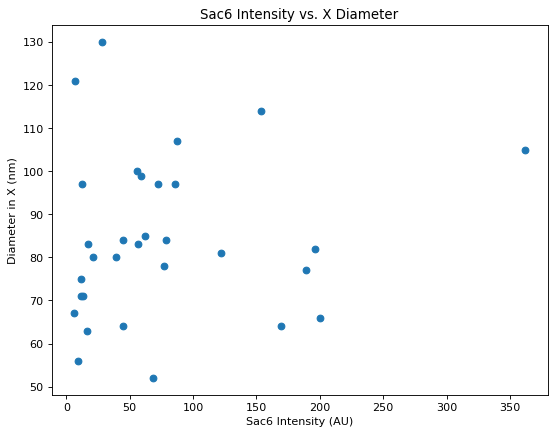

In [9]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['X_spread'])
plt.ylabel("Diameter in X (nm)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. X Diameter")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

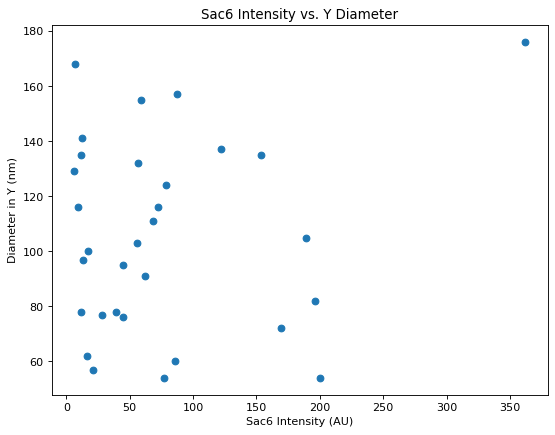

In [10]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['Y_spread'])
plt.ylabel("Diameter in Y (nm)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. Y Diameter")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

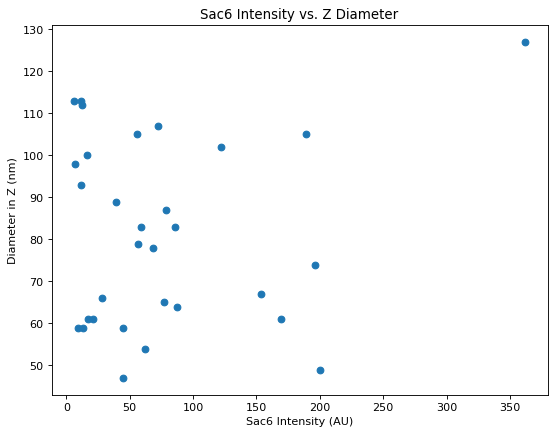

In [11]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['Z_spread'])
plt.ylabel("Diameter in Z (nm)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. Z Diameter")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

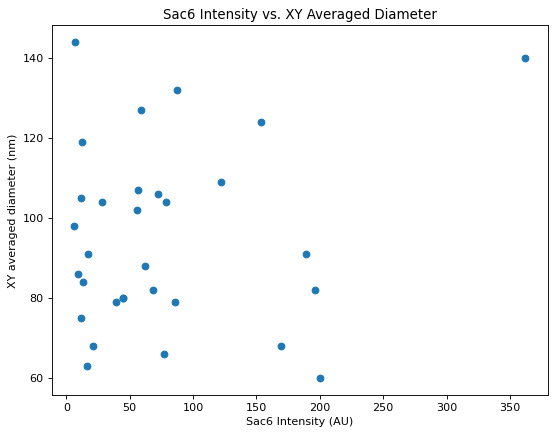

In [12]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['XY_avg_spread'])
plt.ylabel("XY averaged diameter (nm)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. XY Averaged Diameter")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

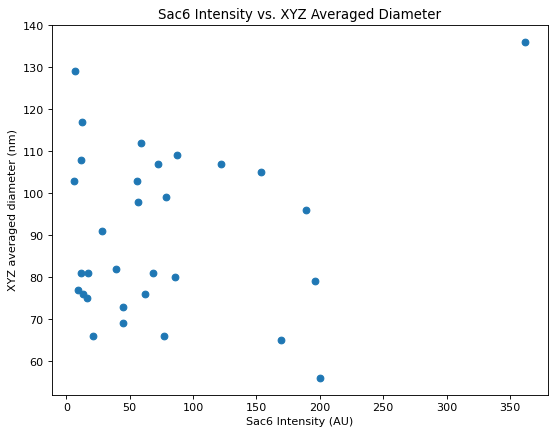

In [13]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['XYZ_avg_spread'])
plt.ylabel("XYZ averaged diameter (nm)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. XYZ Averaged Diameter")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

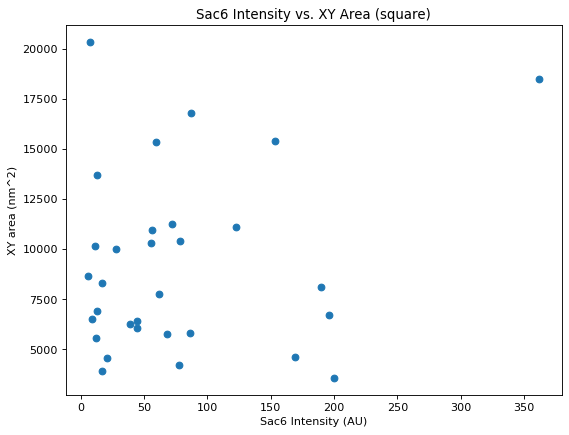

In [14]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], (fullDataset['X_spread']*fullDataset['Y_spread']))
plt.ylabel("XY area (nm^2)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. XY Area (square)")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

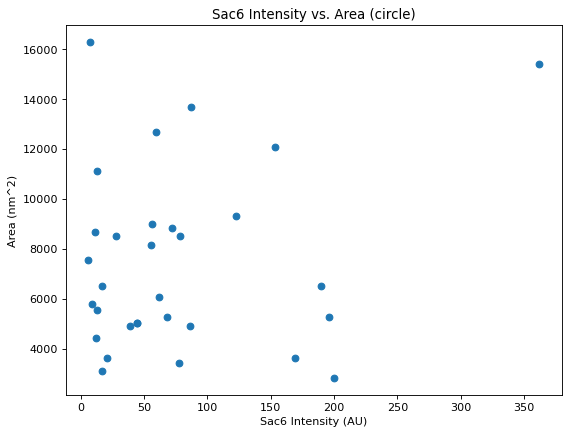

In [15]:
#area (pi*r^2)
#check z-depth of patches from Yidi and Marko's STORM
Area = m.pi*(fullDataset['XY_avg_spread']/2)*(fullDataset['XY_avg_spread']/2)
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], Area)
plt.ylabel("Area (nm^2)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. Area (circle)")
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

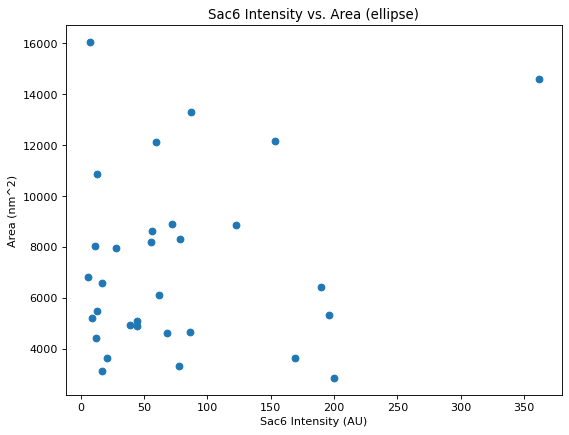

In [16]:
plt.figure(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
plt.scatter(fullDataset['Sac6 Intensity'], fullDataset['Area_ellipse'])
plt.ylabel("Area (nm^2)")
plt.xlabel("Sac6 Intensity (AU)")
plt.title("Sac6 Intensity vs. Area (ellipse)")
plt.savefig(output_folder+"Sac6_intensity_vs_ellipse_area.png")
plt.show